DLPFC

In [2]:
library(SingleCellExperiment)
library(rjson)
library(Seurat)
library(tripack)
# library(proxy)
library(rhdf5)
library(png)
library(ggplot2)
library(harmony)
library(fields)
library(FNN)
library(Matrix)
dirs="/data02/tguo/space_batch_effect/PDAC/"

Loading required package: Rcpp


Attaching package: ‘Matrix’


The following object is masked from ‘package:spam’:

    det


The following object is masked from ‘package:S4Vectors’:

    expand




In [184]:
dirs="/data02/tguo/space_batch_effect/human_DLPFC_10x/"
sce<-get(load(paste(dirs,"origin/DLPFC.Rdata",sep="")))
counts=counts(sce)  ##read count##
rname=paste(colData(sce)$sample_name,"-",colnames(counts),sep="")
colnames(counts)=rname
celltype=read.table(paste(dirs,"origin/barcode_level_layer_map.tsv",sep=""),header=F,sep="\t")
rownames(celltype)=paste(celltype[,2],celltype[,1],sep="-")
colnames(celltype)<-c("barcode","sample_name","layer_map")
x=intersect(rownames(celltype),colnames(counts))
counts=counts[,x]
celltype=celltype[x,]
# # # unique(a$layer_guess_reordered)
###所有样本生成1个seurat object#####
####image数据#####
###注意：这里选择low resolution。输入的position list是full image的。根据json文件中的scale_factor得到high image和low image的坐标###
sample_name=unique(colData(sce)$sample_name)
image_files=list.files(paste(dirs,"origin/",sep=""),"lowres")
sf_files=list.files(paste(dirs,"origin/",sep=""),"scalefactors")
posi_files=list.files(paste(dirs,"origin/",sep=""),"positions_list")
obj_name=paste("obj",seq(1,length(sample_name)),sep="_")
####为每个sample 生成seurat object####
i=1
sample_name1=sample_name[i]
img=readPNG(paste(dirs,'origin/',grep(sample_name1,image_files,value=T),sep=""))
sf=fromJSON(paste(readLines(paste(dirs,'origin/',grep(sample_name1,sf_files,value=T),sep='')), collapse=""))
sf=scalefactors(spot=sf$spot_diameter_fullres,fiducial=sf$fiducial_diameter_fullres,hires=sf$tissue_hires_scalef,lowres=sf$tissue_lowres_scalef)
posi=read.csv(paste(dirs,'origin/',grep(sample_name1,posi_files,value=T),sep=''),header=FALSE,stringsAsFactors=F,row.names=1)
rownames(posi)<-paste(sample_name1,rownames(posi),sep="-")
colnames(posi)=c('tissue','row','col','imagerow','imagecol')
counts1=counts[,which(grepl(as.character(sample_name1),colnames(counts)))]
celltype1=celltype[which(grepl(as.character(sample_name1),rownames(celltype))),]
posi1=posi[rownames(celltype1),]
dlpfc<-CreateSeuratObject(counts=counts1,meta.data=celltype1,project=as.character(sample_name1),assay="Spatial")
# assign(obj_name[i],dlpfc)
####生成seurat image object#####
dlpfc@images$sample=new(
    Class='VisiumV1',
    image=img,
    scale.factors=sf,
    coordinates=posi1,
    spot.radius=(sf$fiducial[[1]]*sf$lowres[[1]])/max(dim(img)),
    assay='Spatial',
    key=as.character(sample_name[i])
)
saveRDS(dlpfc,paste(dirs,"seurat_ob/",sample_name[i],"_spatial_seurat_ob.rds",sep=""))
for(i in 2:length(sample_name)){
    img=readPNG(paste(dirs,'origin/',grep(sample_name[i],image_files,value=T),sep=""))
    sf=fromJSON(paste(readLines(paste(dirs,'origin/',grep(sample_name[i],sf_files,value=T),sep='')), collapse=""))
    sf=scalefactors(spot=sf$spot_diameter_fullres,fiducial=sf$fiducial_diameter_fullres,hires=sf$tissue_hires_scalef,lowres=sf$tissue_lowres_scalef)
    posi=read.csv(paste(dirs,'origin/',grep(sample_name[i],posi_files,value=T),sep=''),header=FALSE,stringsAsFactors=F,row.names=1)
    rownames(posi)<-paste(sample_name[i],rownames(posi),sep="-")
    colnames(posi)=c('tissue','row','col','imagerow','imagecol')
    ####为每个sample 生成seurat object####
    counts1=counts[,which(grepl(as.character(sample_name[i]),colnames(counts)))]
    celltype1=celltype[which(grepl(as.character(sample_name[i]),rownames(celltype))),]
    posi1=posi[rownames(celltype1),]
    obj<-CreateSeuratObject(counts=counts1,meta.data=celltype1,project=as.character(sample_name[i]),assay="Spatial")
#     assign(obj_name[i],obj)
    ####生成seurat image object#####
    obj@images$sample=new(
        Class='VisiumV1',
        image=img,
        scale.factors=sf,
        coordinates=posi1,
        spot.radius=(sf$fiducial[[1]]*sf$lowres[[1]])/max(dim(img)),
        assay='Spatial',
        key=as.character(sample_name[i])
    )
    saveRDS(obj,paste(dirs,"seurat_ob/",sample_name[i],"_spatial_seurat_ob.rds",sep=""))
    dlpfc <- merge(dlpfc, y=obj)
}

dlpfc.list<- SplitObject(dlpfc, split.by = "sample_name")
dlpfc.list <- lapply(X = dlpfc.list, FUN = function(x) {
    x <- SCTransform(x,assay='Spatial',verbose=F)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 3000)
    x <- RunPCA(x, assay = "SCT", verbose = FALSE,npcs=30)
    x <- RunUMAP(x, reduction = "pca", dims = 1:30)
})
features <- SelectIntegrationFeatures(object.list = dlpfc.list)
anchors <- FindIntegrationAnchors(object.list = dlpfc.list)
dlpfc.combined<-IntegrateData(anchorset =anchors)
write.table(features,paste(dirs,"input/integrated_hvg.txt",sep=""),col.names=F,row.names=F,quote=F)
for(idx in 1:length(dlpfc.list)){
    dirs1=paste(dirs,'/',sample_name[idx],'_exp_graph/',sep='')
    if(!file.exists(dirs1)){
        dir.create(dirs1)
    }
    a=dlpfc.list[[idx]]
    vf=VariableFeatures(a)
    exp=a@assays$SCT@data
    layer=a$layer_map
    sample=unique(a$sample_name)
    write.table(t(as.matrix(exp)),paste(dirs,'input/',sample,"_features.txt",sep=""),quote=F,col.names=T,row.names=T)
    write.table(as.data.frame(layer),paste(dirs,'input/',sample,"_label.txt",sep=""),quote=F,col.names=F,row.names=T,sep=',')
    write.table(vf,paste(dirs,'input/',sample,"_HVG.txt",sep=""),quote=F,col.names=F,row.names=F)
    write.table(a@reductions$pca@cell.embeddings,paste(dirs,'input/',sample,'_pca.txt',sep=""),col.names=T,row.names=T,quote=F)
    write.table(a@reductions$umap@cell.embeddings,paste(dirs,'input/',sample,'_umap.txt',sep=""),col.names=T,row.names=T,quote=F)
    #########根据空间转录组的排布找邻居##########
    pair=c()
    coord=a@images[[idx]]@coordinates
    NAME=rownames(coord)
    for(i in 1:dim(coord)[1]){
        x=coord[i,1]
        y=coord[i,2]
        id=c(NAME[which(coord$row==(x-1)&coord$col==(y-1))],NAME[which(coord$row==(x-1)&coord$col==(y+1))],
            NAME[which(coord$row==(x)&coord$col==(y-2))],NAME[which(coord$row==(x)&coord$col==(y+2))],
            NAME[which(coord$row==(x+1)&coord$col==(y-1))],NAME[which(coord$row==(x+1)&coord$col==(y+1))])
        pair=c(pair,list(id))
    }
    useful_pair=c()
    useful_node=c()
    for(i in 1:length(NAME)){
        N=length(pair[[i]])
        if(N>0){
            useful_node=c(useful_node,NAME[i])
            for(j in 1:N){
                useful_pair=c(useful_pair,paste(NAME[i],pair[[i]][j],sep=":"))
            }
        }
    }
    write.table(as.data.frame(useful_pair),paste(dirs,'input/',sample,"_edge_10x.txt",sep=""),quote=F,col.names=F,row.names=F)

    ####构建 Delaunay triangulation####
    coord=a@images[[idx]]@coordinates[,4:5]*a@images[[idx]]@scale.factors$lowres
    colnames(coord)<-c('x','y')
    b=tri.mesh(coord)
    nei1=neighbours(b)
    # plot.tri(b)
    DIS=c()
    PAIR=c()
    for(j in 1:dim(coord)[1]){
        DIS=c(DIS,rdist(coord[j,],coord[nei1[[j]],]))
        PAIR=c(PAIR,paste(NAME[j],NAME[nei1[[j]]],sep=":"))
    }
    DIS=data.frame(distance=DIS)
    rownames(DIS)<-PAIR
    # ##test abnormal value: intequantile range(IQR)####
    x=quantile(DIS$distance, probs = seq(0,1,0.25), na.rm = FALSE,names = TRUE)
    iqr=x[[3]]-x[[1]]
    I_low=x[[1]]-1.5*iqr
    I_high=x[[3]]+1.5*iqr
    abn_idx=which((DIS$distance<I_low)|(DIS$distance>I_high))
    useful_pair=rownames(DIS)[-abn_idx]
    write.table(as.data.frame(useful_pair),paste(dirs,'input/',sample,"_edge_delaunay.txt",sep=""),quote=F,col.names=F,row.names=F)
    #######KNN#########
    K=20
    knnlist=get.knn(coord,k=K)
    knnindex=data.frame(knnlist$nn.index)
    useful_pair=c()
    for(i in 1:length(NAME)){
        for(j in 1:K){
            useful_pair=c(useful_pair,paste(NAME[i],NAME[knnindex[i,j]],sep=":"))
        }
    }
    write.table(as.data.frame(useful_pair),paste(dirs,'input/',sample,"_edge_knn",K,".txt",sep=""),quote=F,col.names=F,row.names=F)
}
# ########生成scanpy可以处理的空间数据格式#########
# for(idx in 2:length(sample_name)){
#     a=read.table(paste(dirs,"/",sample_name[idx],"_exp_graph/",sample_name[idx],"_features.txt",sep=""))
#     dirs1=paste(dirs,'/scanpy_file/',sample_name[idx],sep='')
#     if(!file.exists(dirs1)){
#         dir.create(dirs1)
#     }
#     h5write(as.matrix(a),paste(dirs1,"/Express.h5",sep=""),"normalized")
# }
# for(idx in 1:length(sample_name)){
#     dirs1=paste(dirs,'/scanpy_file/',sample_name[idx],'/spatial',sep='')
#     if(!file.exists(dirs1)){
#         dir.create(dirs1)
#     }
#     image_files1=paste(sample_name[idx],"_tissue_lowres_image.png",sep="")
#     image_files2=paste(sample_name[idx],"_tissue_hires_image.png",sep="")
#     sf_files=paste(sample_name[idx],"_scalefactors_json.json",sep="")
#     posi_files=paste(sample_name[idx],"_tissue_positions_list.txt",sep="")
#     file.copy(from=paste(dirs,"/",image_files1,sep=""), to=paste(dirs1,"/tissue_lowres_image.png",sep=""))
#     file.copy(from=paste(dirs,"/",image_files2,sep=""), to=paste(dirs1,"/tissue_hires_image.png",sep=""))
#     file.copy(from=paste(dirs,"/",sf_files,sep=""), to=paste(dirs1,"/scalefactors_json.json",sep=""))
#     file.copy(from=paste(dirs,"/",posi_files,sep=""), to=paste(dirs1,"/tissue_positions_list.csv",sep=""))
# }
# # dlpfc=RunPCA(dlpfc,npcs = 50)
# # dlpfc=RunUMAP(dlpfc,dims=1:30)
# # DimPlot(dlpfc,reduction="umap",group="layer_map",label=T)
# SpatialDimPlot(dlpfc,group.by='layer_map',label=TRUE)
# dlpfc$label_new=read.csv("/data02/tguo/sptail_temporal/human_DLPFC_10x/151507_GraphSage/unsup-training/mean_small_0.000010/10_1_louvain_label.csv",row.names=1)
# SpatialDimPlot(dlpfc,group.by='label_new',label=T)
# # marker=FindMarkers(dlpfc, ident.1 = 8, ident.2 = 2, group.by='label_new',min.pct = 0.25)

In [7]:
dirs="/data02/tguo/space_batch_effect/human_DLPFC_10x/"
samples=c(151507,151508,151509,151510,151669,151670,151671,151672,151673,151674,151675,151676)
samples=c("151673","151674")
embed1_file=paste(dirs,"gtt_output/AGC_embed_",samples[1],"_",samples[2],".csv",sep="")
embed2_file=paste(dirs,"methods/seurat_mat_",samples[1],"_",samples[2],".txt",sep="")
embed3_file=paste(dirs,"methods/harmony_mat_",samples[1],"_",samples[2],".txt",sep="")
embed4_file=paste(dirs,"methods/STAGATE_mat_",samples[1],"_",samples[2],".txt",sep="")
meta_file=c()
mat_file=c()
coord_file=c()
for(i in 1:length(samples)){
    meta_file=c(meta_file,paste(dirs,"input/",samples[i],"_label.txt",sep=""))
    mat_file=c(mat_file,paste(dirs,"input/",samples[i],"_features.txt",sep=""))
    coord_file=c(coord_file,paste(dirs,"input/",samples[i],"_positions.txt",sep=""))
}

In [15]:
########analysis##########
embed1=read.csv(embed1_file,header=T,row.names=1,sep=',')
embed2=read.csv(embed2_file,header=T,row.names=1,sep=',')
embed3=read.csv(embed3_file,header=T,row.names=1,sep=',')
embed4=read.csv(embed4_file,header=T,row.names=1,sep=',')
meta=read.csv(meta_file[1],header=T,row.names=1,sep=',')
mat=read.csv(mat_file[1],header=T,row.names=1,sep=',')
coord=read.csv(coord_file[1],header=T,row.names=1,sep=',')

for(i in 2:length(meta_file)){
    meta<-rbind(meta,read.csv(meta_file[i],header=T,row.names=1,sep=','))
    mat<-rbind(mat,read.csv(mat_file[i],header=T,row.names=1,sep=','))
    coord=rbind(coord,read.csv(coord_file[i],header=T,row.names=1,sep=','))
}
coord=coord[,c('x','y')]
colnames(coord)<-c('site1','site2')
mat=as.matrix(t(mat))
mat=as(mat,'dgCMatrix')
meta=meta[colnames(mat),]
coord=coord[colnames(mat),]
obj<-CreateSeuratObject(counts=mat,meta.data=meta)

obj[['GTT']]<-CreateDimReducObject(embeddings=as.matrix(embed1), key = "GTT_", assay=DefaultAssay(obj))
obj[['Seurat']]<-CreateDimReducObject(embeddings=as.matrix(embed2), key = "Seurat_", assay=DefaultAssay(obj))
obj[['Harmony']]<-CreateDimReducObject(embeddings=as.matrix(embed3), key = "Harmony_", assay=DefaultAssay(obj))
obj[['STAGATE']]<-CreateDimReducObject(embeddings=as.matrix(embed4), key = "STAGATE_", assay=DefaultAssay(obj))
obj[['Spatial']]<-CreateDimReducObject(embeddings=as.matrix(coord), key = "Spatial_", assay=DefaultAssay(obj))
VariableFeatures(obj)<-rownames(obj)
obj@assays$RNA@scale.data=as.matrix(mat)
obj<-RunPCA(obj,npcs=30,features=rownames(mat))
obj<-FindNeighbors(obj,reduction="GTT",dims=3:dim(embed1)[2])
obj<-FindClusters(obj,resolution = 1.0)
obj$gtt_clust=obj$seurat_clusters
obj<-FindNeighbors(obj,reduction="Seurat",dims=1:dim(embed2)[2])
obj<-FindClusters(obj,resolution = 1.0)
obj$seurat_clust=obj$seurat_clusters
obj<-FindNeighbors(obj,reduction="Harmony",dims=1:dim(embed3)[2])
obj<-FindClusters(obj,resolution = 1.0)
obj$harmony_clust=obj$seurat_clusters
obj<-FindNeighbors(obj,reduction="STAGATE",dims=1:dim(embed4)[2])
obj<-FindClusters(obj,resolution = 1.0)
obj$STAGATE_clust=obj$seurat_clusters
obj<-RunUMAP(obj, dims=1:30)
obj<-RunUMAP(obj, dims=3:dim(embed1)[2],reduction='GTT',reduction.name="gtt.umap",reduction.key="GTTUMAP_")
obj<-RunUMAP(obj, dims=1:dim(embed2)[2],reduction='Seurat',reduction.name="seurat.umap",reduction.key="SeuratUMAP_")
obj<-RunUMAP(obj, dims=1:dim(embed3)[2],reduction='Harmony',reduction.name="harmony.umap",reduction.key="HarmonyUMAP_")
obj<-RunUMAP(obj, dims=1:dim(embed4)[2],reduction='STAGATE',reduction.name="stagate.umap",reduction.key="STAGATEUMAP_")

PC_ 1 
Positive:  ENSG00000198804, ENSG00000198712, ENSG00000198938, ENSG00000198888, ENSG00000167996, ENSG00000087250, ENSG00000111640, ENSG00000101439, ENSG00000229117, ENSG00000132639 
	   ENSG00000154146, ENSG00000120885, ENSG00000075624, ENSG00000197971, ENSG00000034510, ENSG00000198786, ENSG00000123416, ENSG00000198668, ENSG00000269028, ENSG00000143933 
	   ENSG00000166165, ENSG00000205542, ENSG00000087460, ENSG00000189043, ENSG00000156508, ENSG00000164919, ENSG00000137818, ENSG00000163032, ENSG00000152583, ENSG00000087086 
Negative:  ENSG00000269900, ENSG00000214353, ENSG00000180745, ENSG00000225174, ENSG00000161905, ENSG00000278740, ENSG00000275120, ENSG00000008226, ENSG00000168060, ENSG00000205403 
	   ENSG00000125538, ENSG00000123342, ENSG00000231768, ENSG00000109805, ENSG00000168298, ENSG00000135378, ENSG00000235387, ENSG00000110375, ENSG00000225127, ENSG00000228061 
	   ENSG00000102032, ENSG00000263305, ENSG00000134962, ENSG00000273796, ENSG00000215424, ENSG00000163808, ENS

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7246
Number of edges: 231191

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7604
Number of communities: 9
Elapsed time: 1 seconds


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7246
Number of edges: 303345

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7703
Number of communities: 12
Elapsed time: 1 seconds


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7246
Number of edges: 264710

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7438
Number of communities: 10
Elapsed time: 1 seconds


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7246
Number of edges: 264710

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7438
Number of communities: 10
Elapsed time: 1 seconds


In [19]:
obj<-RunUMAP(obj, dims=3:dim(embed1)[2],reduction='GTT',reduction.name="gtt.umap",reduction.key="GTTUMAP_")
obj<-RunUMAP(obj, dims=1:dim(embed2)[2],reduction='Seurat',reduction.name="seurat.umap",reduction.key="SeuratUMAP_")
obj<-RunUMAP(obj, dims=1:dim(embed3)[2],reduction='Harmony',reduction.name="harmony.umap",reduction.key="HarmonyUMAP_")
obj<-RunUMAP(obj, dims=1:dim(embed4)[2],reduction='STAGATE',reduction.name="stagate.umap",reduction.key="STAGATEUMAP_")

18:38:14 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

18:38:14 Read 7246 rows and found 14 numeric columns

18:38:14 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

18:38:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

18:38:15 Writing NN index file to temp file /tmp/RtmpsIFzgK/file2f854104bd94

18:38:15 Searching Annoy index using 1 thread, search_k = 3000

18:38:19 Annoy recall = 100%

18:38:20 Commencing smooth kNN distance calibration using 1 thread

18:38:21 Initializing from normalized Laplacian + noise

18:38:22 Commencing opti

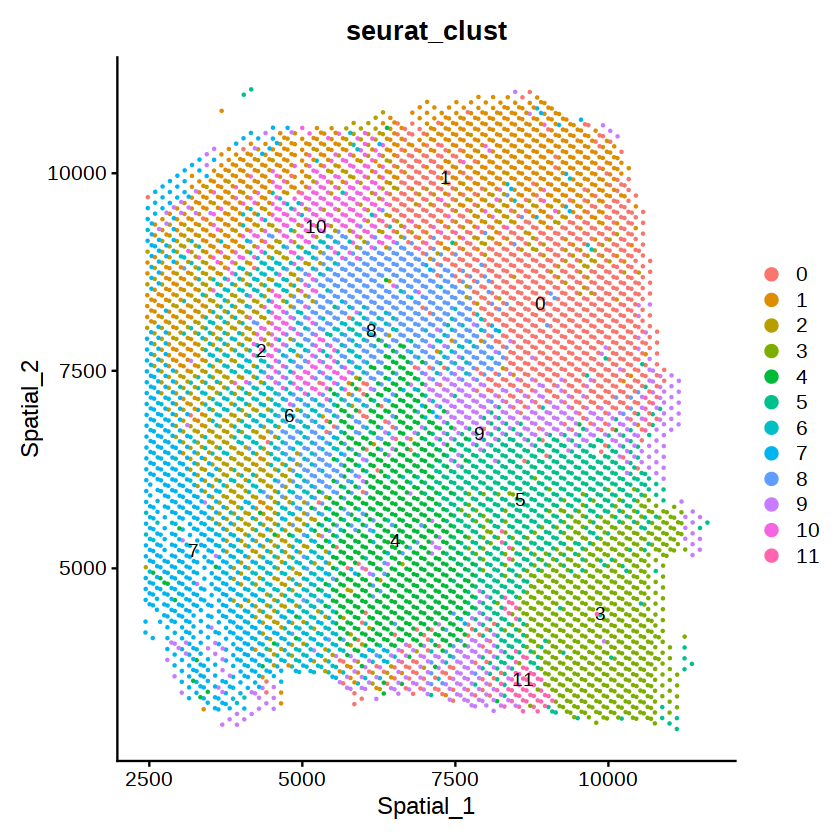

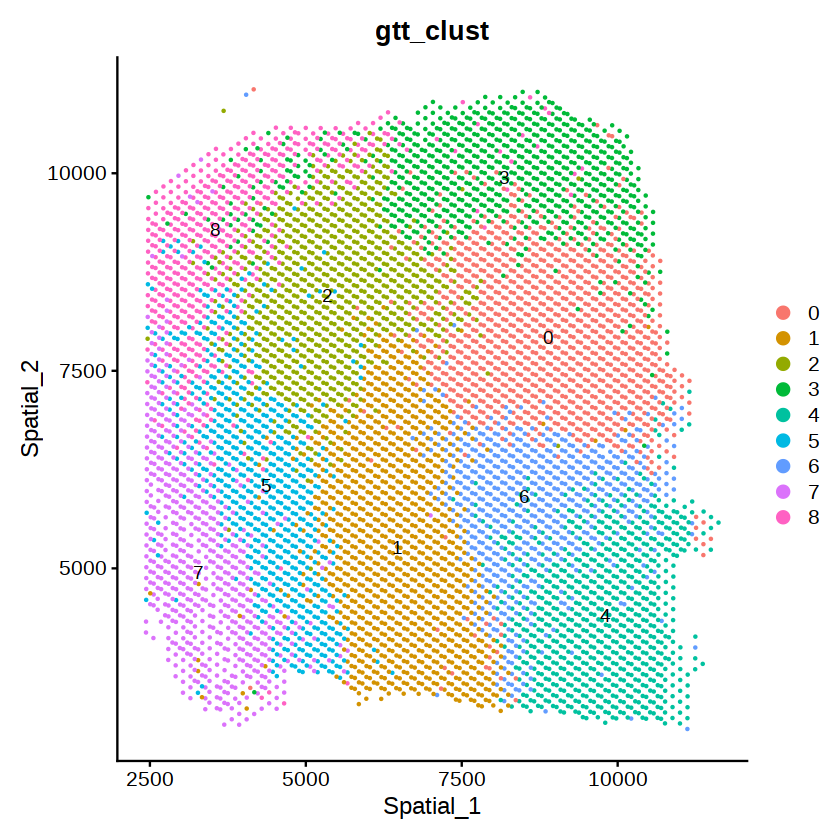

In [28]:
DimPlot(obj,reduction='Spatial',dims=1:2,group.by='seurat_clust',label=T)
DimPlot(obj,reduction='Spatial',dims=1:2,group.by='gtt_clust',label=T)

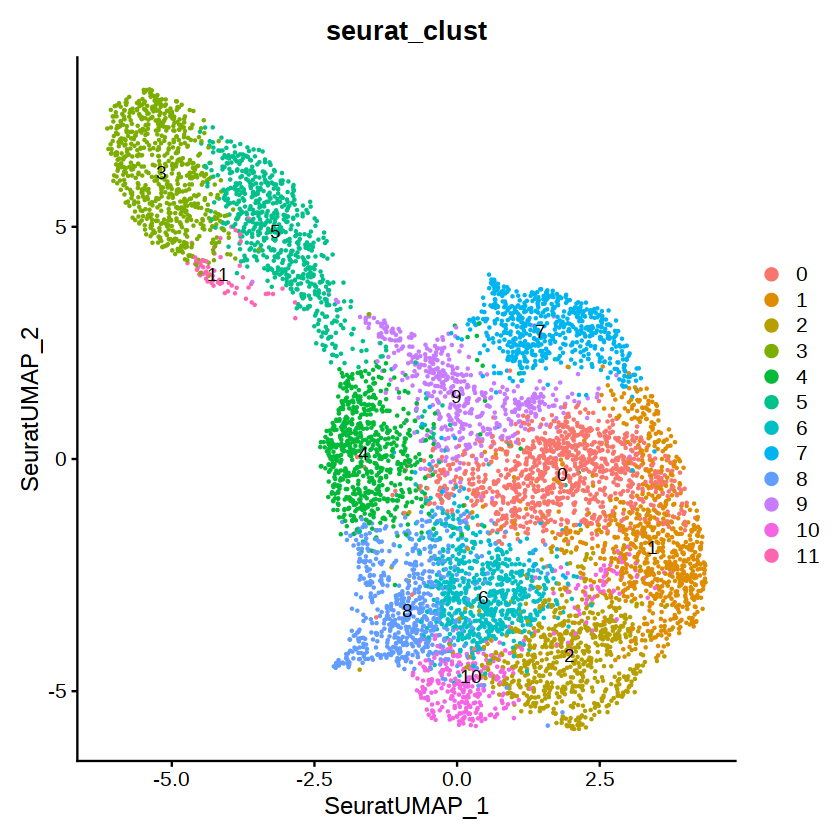

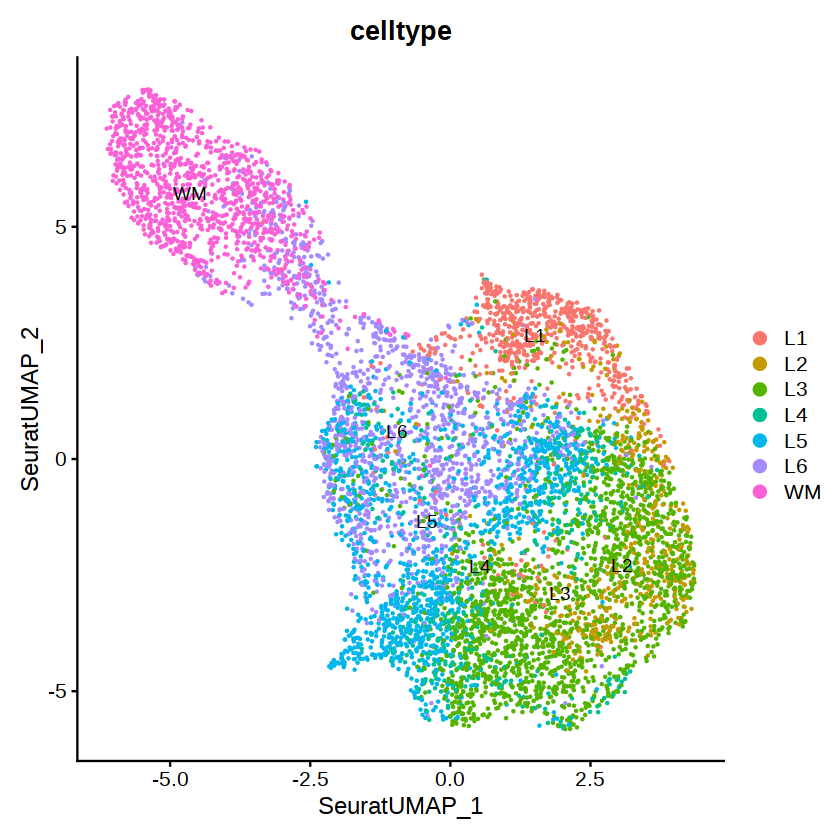

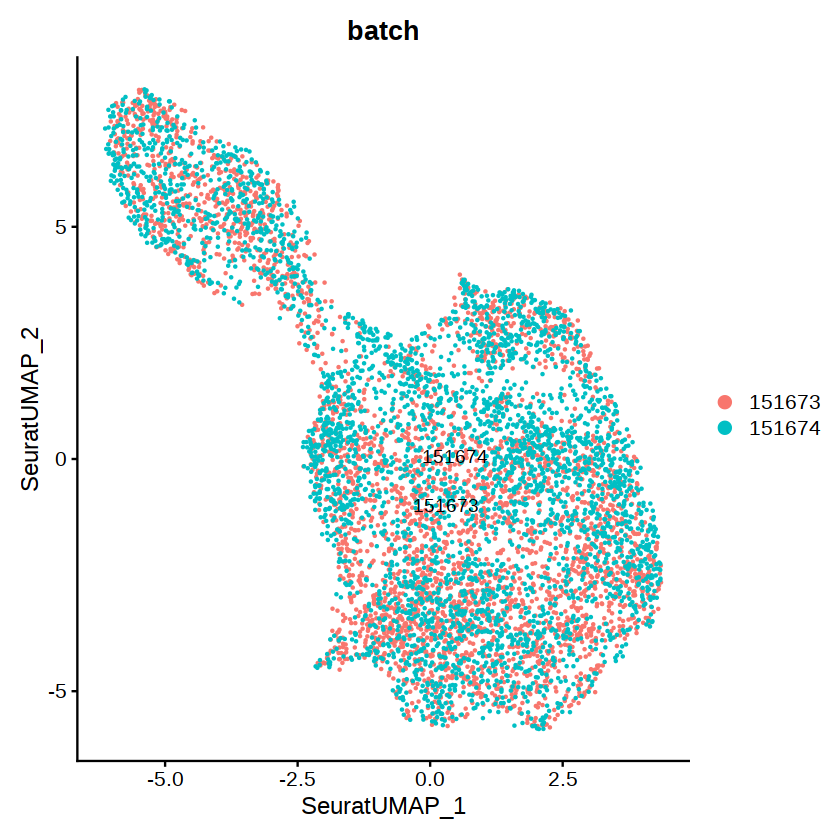

In [35]:
red='seurat.umap'
group='seurat_clust'
DimPlot(obj,reduction=red,dims=1:2,group.by=group,label=T)
DimPlot(obj,reduction=red,dims=1:2,group.by='celltype',label=T)
DimPlot(obj,reduction=red,dims=1:2,group.by='batch',label=T)

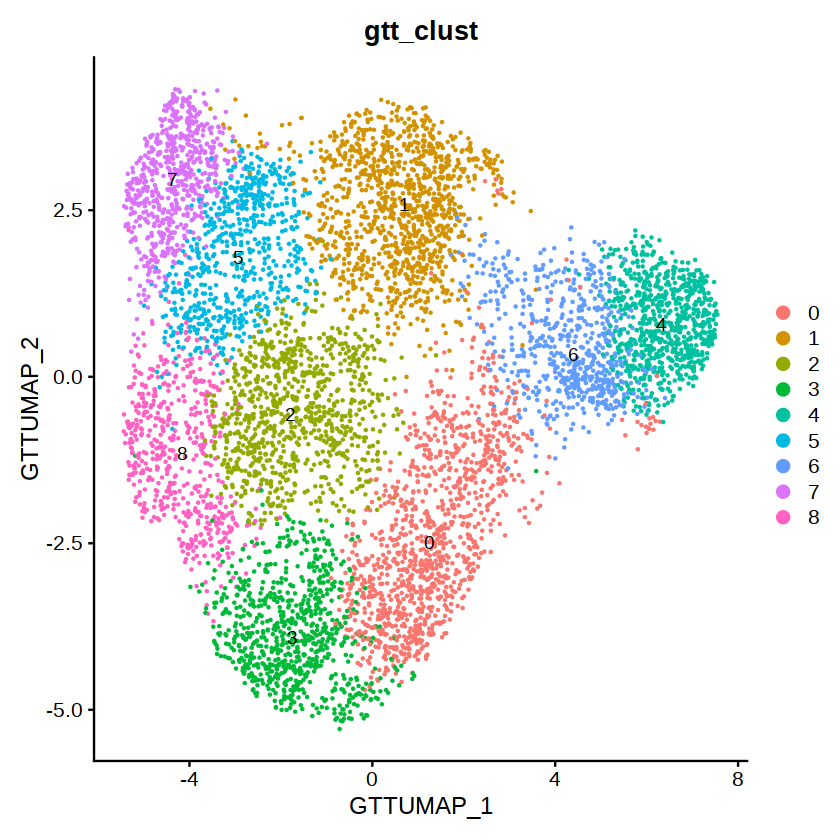

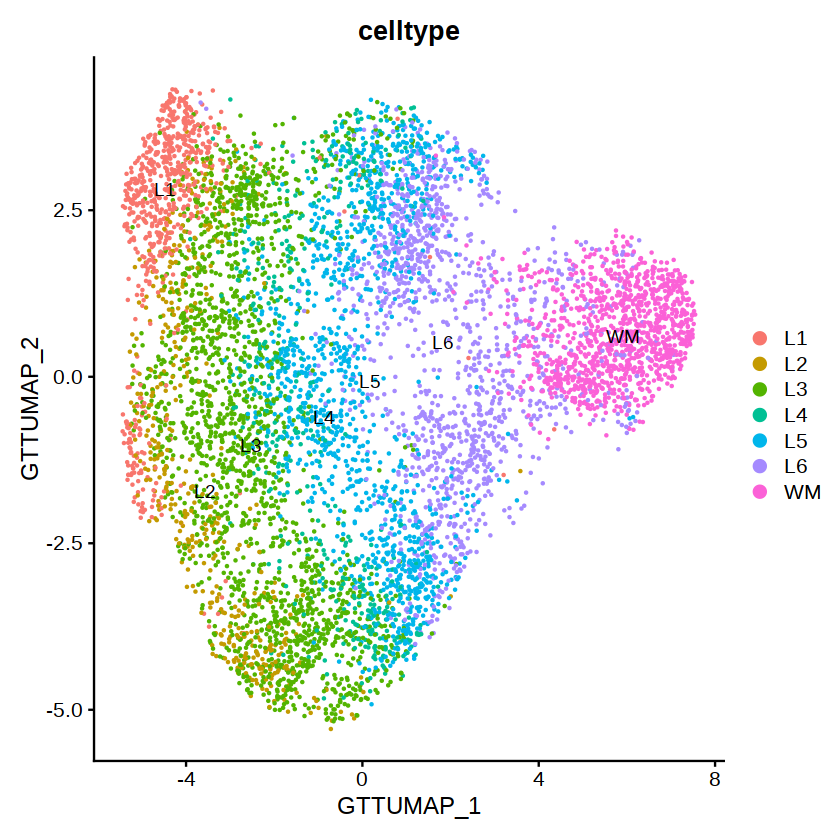

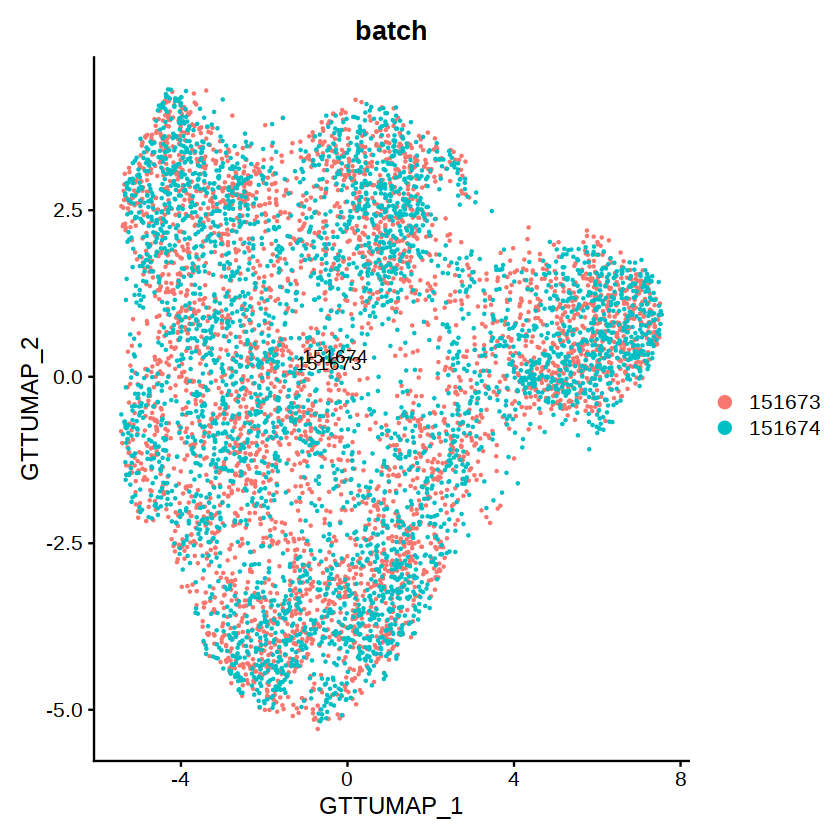

In [36]:
red='gtt.umap'
group='gtt_clust'
DimPlot(obj,reduction=red,dims=1:2,group.by=group,label=T)
DimPlot(obj,reduction=red,dims=1:2,group.by='celltype',label=T)
DimPlot(obj,reduction=red,dims=1:2,group.by='batch',label=T)

othermethods

In [1]:
library(SingleCellExperiment)
library(rjson)
library(Seurat)
library(tripack)
# library(proxy)
library(rhdf5)
library(png)
library(ggplot2)
library(harmony)
library(fields)
library(FNN)
library(Matrix)
dirs="/data02/tguo/space_batch_effect/human_DLPFC_10x/"

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

In [2]:
samples=c(151507,151508,151509,151510,151669,151670,151671,151672,151673,151674,151675,151676)
# samples=samples[c(1,9)]
flags1=samples[1];for(i in 2:length(samples)){flags1=paste(flags1,'-',samples[i],sep='')}
meta_file=c()
mat_file=c()
flags=''
for(i in 1:length(samples)){
    meta_file=c(meta_file,paste(dirs,"gtt_input_scanpy/",flags1,'_',samples[i],"_label.txt",sep=""))
    mat_file=c(mat_file,paste(dirs,"gtt_input_scanpy/",flags1,'_',samples[i],"_features.txt",sep=""))
    flags=paste(flags,'_',samples[i],sep='')
}
meta=read.csv(meta_file[1],header=T,row.names=1,sep=',')
count=read.csv(mat_file[1],header=T,row.names=1,sep=',')
for(i in 2:length(meta_file)){
    meta<-rbind(meta,read.csv(meta_file[i],header=T,row.names=1,sep=','))
    count<-rbind(count,read.csv(mat_file[i],header=T,row.names=1,sep=','))
} 
count=as.matrix(t(count))
count=as(count,'dgCMatrix')
meta=meta[colnames(count),]

PC_ 1 
Positive:  AC087362.2, GUCA2B, FOLR3, G6PC, LINC00470, AC123023.1, AL445584.2, AC092171.1, AL157938.3, AC104170.1 
	   KAAG1, AF131215.3, STOML3, TESC.AS1, AC103855.1, ZFY.AS1, APOL5, OTX2, LINC00494, OR1E1 
	   LBX1, APOA5, RGPD4, AL592295.4, AL049830.3, LINC02422, Z84484.1, ACP4, C12orf56, LAMB4 
Negative:  MT.CO2, MT.CO1, MT.CO3, MT.ATP6, MT.ND3, FTH1, GAPDH, TMSB10, SNAP25, NRGN 
	   ACTB, TUBA1B, CALM1, NDUFA4, CALM2, GNAS, TMSB4X, CKB, COX6C, CCK 
	   VSNL1, SPARCL1, PPIA, YWHAH, UBB, UCHL1, ITM2B, OLFM1, MBP, HSP90AA1 
PC_ 2 
Positive:  GFAP, MBP, PLP1, MT.CO2, CRYAB, MT.CO3, FTH1, S100B, MT.ATP6, MT.CO1 
	   PTGDS, SCGB2A2, CNP, TF, MT.ND3, SCD, MOBP, CLDND1, MALAT1, MARCKSL1 
	   PPP1R14A, GPM6B, RNASE1, SPP1, QKI, MAG, CSRP1, APOD, PLEKHB1, GPRC5B 
Negative:  ENC1, NEFL, LMO4, RGS4, RAB3A, GAP43, NEFM, NSF, GABRA1, STMN2 
	   NPTN, SNCB, MDH1, CABP1, TAGLN3, HOPX, MEF2C, SYP, BASP1, SNCG 
	   PPP3CA, ATP1A1, BEX5, ATP2B2, NELL2, SERPINI1, BEX1, GABBR2, PAK1, NRN1 
PC_ 

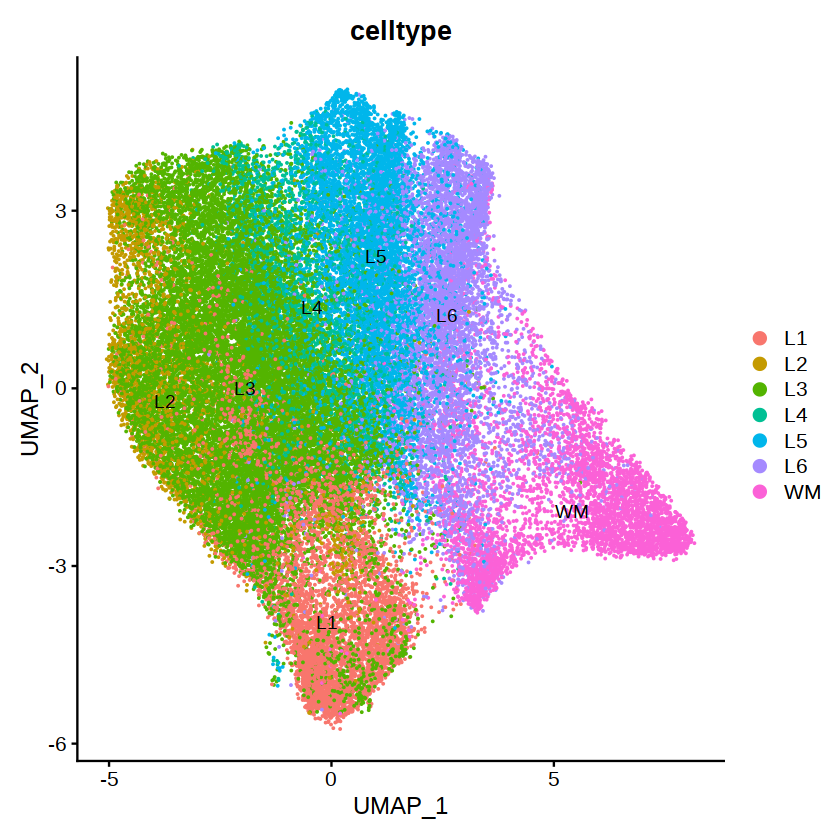

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 14241 anchors

Filtering anchors

	Retained 2668 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 14899 anchors

Filtering anchors

	Retained 2507 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 15162 anchors

Filtering anchors

	Retained 2435 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 14720 anchors

Filtering anchors

	Retained 2447 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 15013 anchors

Filtering anchors

	Retained 2419 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 15819 anchors

Filtering anchors

	Retained 2877 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 13322 anchors

Filtering anchors

	Retained 

Finding neighborhoods

Finding anchors

	Found 11763 anchors

Filtering anchors

	Retained 1970 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 12643 anchors

Filtering anchors

	Retained 2249 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 12485 anchors

Filtering anchors

	Retained 2336 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 11653 anchors

Filtering anchors

	Retained 3163 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 11623 anchors

Filtering anchors

	Retained 3043 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 11689 anchors

Filtering anchors

	Retained 3060 anchors

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined b

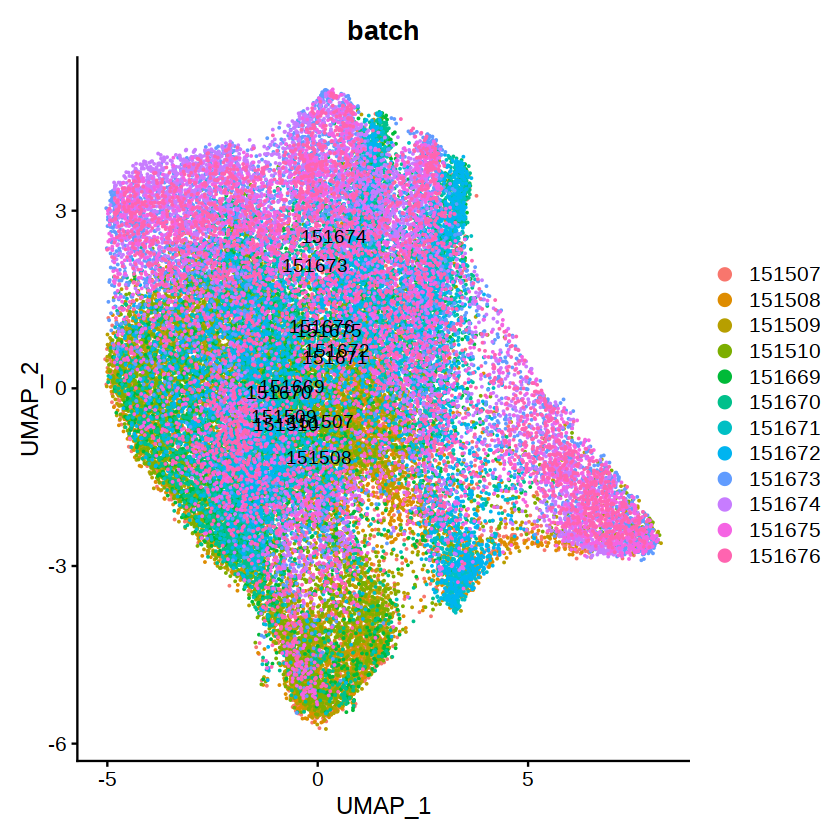

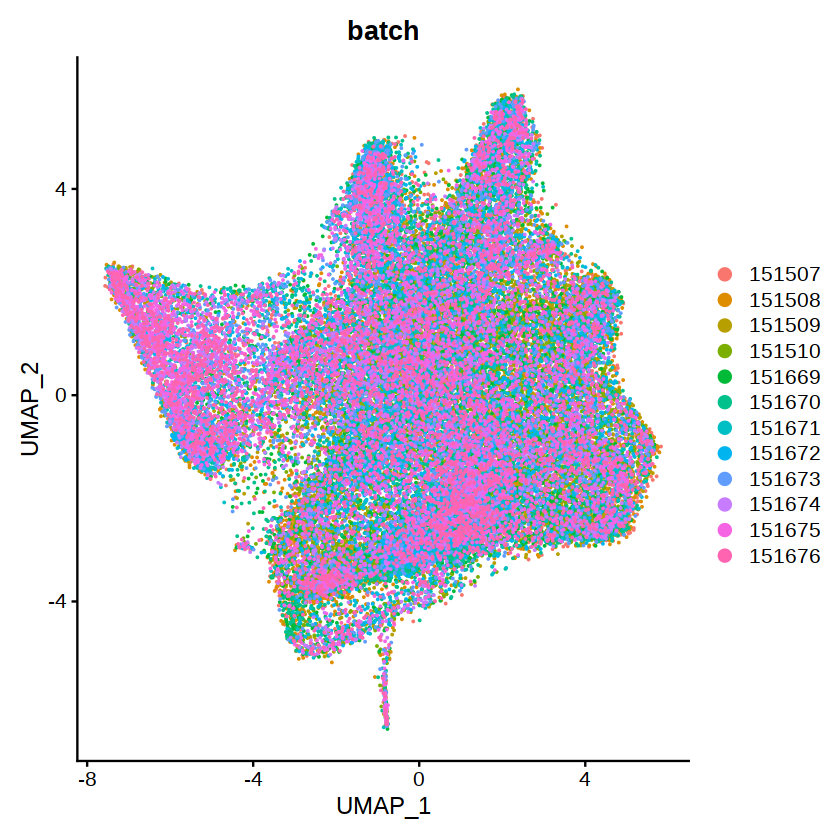

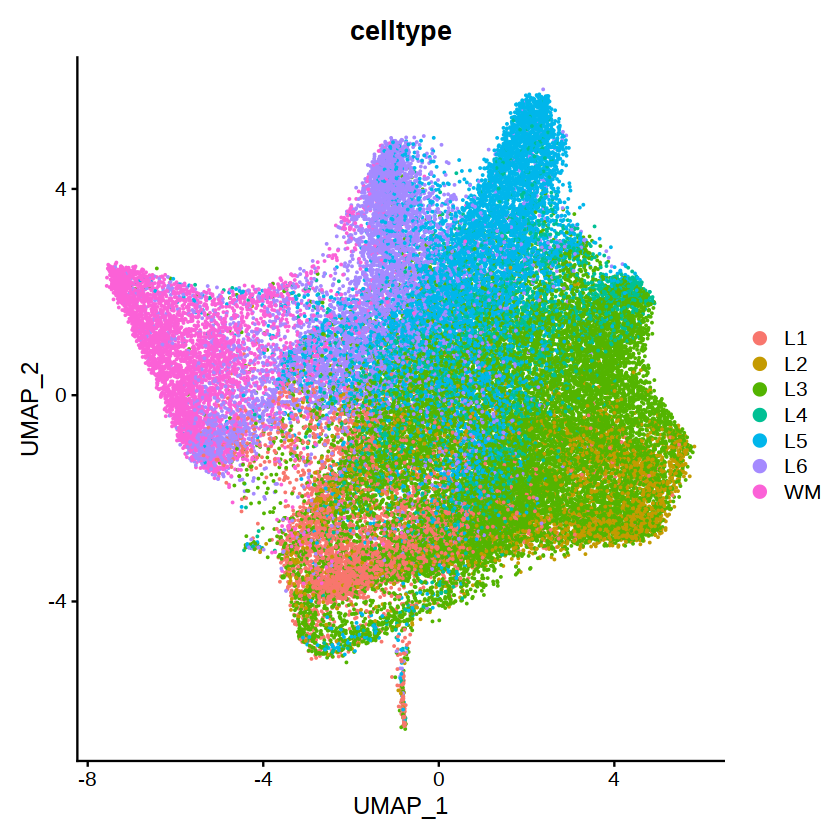

In [3]:
######seurat##########
dl<-CreateSeuratObject(counts=count,min.cells=0, min.features=0,meta.data=meta)
VariableFeatures(dl)<-rownames(dl)
dl@assays$RNA@scale.data=as.matrix(count)
# dl<-ScaleData(dl)
dl<-RunPCA(dl,npcs=30)
dl<-RunUMAP(dl,reduction='pca',dims=1:30)
DimPlot(dl,group.by='celltype',label=T)
DimPlot(dl,group.by='batch',label=T)
dl.list<-SplitObject(dl, split.by = "batch")
# features<-SelectIntegrationFeatures(object.list=dl.list)
features<-rownames(dl)
obj.anchors<-FindIntegrationAnchors(object.list = dl.list, anchor.features = features)
obj.inte<-IntegrateData(anchorset=obj.anchors,dims=1:30,verbose=F,k.weight=100)
# obj.inte<-ScaleData(obj.inte,verbose=F)
obj.inte@assays$integrated@scale.data=as.matrix(obj.inte@assays$integrated@data)
obj.inte<-RunPCA(obj.inte,npcs=30,verbose=F)
obj.inte<-RunUMAP(obj.inte,reduction="pca",dims=1:30,verbose=F)
DimPlot(obj.inte,group.by="batch")
DimPlot(obj.inte,group.by="celltype")
x=as.data.frame(obj.inte@reductions$pca@cell.embeddings)
x=x[rownames(meta),]
write.csv(x,paste(dirs,"methods/seurat_mat",flags,".txt",sep=""))
x=t(as.data.frame(obj.inte@assays$integrated@data))
x=x[rownames(meta),]
write.csv(x,paste(dirs,"methods/seurat_expression",flags,".txt",sep=""))

Centering and scaling data matrix

PC_ 1 
Positive:  AL391095.1, LINC02073, AC016708.1, ZNF157, STOML3, AC068408.1, OR7A5, GOLGA8R, AC006033.2, AC092447.5 
	   HHIPL2, UBE2E2.AS1, TESC.AS1, AC092813.2, COX7B2, AC084782.3, AC068234.3, GOLGA6L1, AC090907.2, AL157938.3 
	   LINC01118, BX005040.1, CXCR6, CTLA4, AL353626.1, SLC47A2, AC006372.3, C20orf202, LBX1, AC009093.1 
Negative:  MT.CO1, MT.CO2, MT.CO3, GAPDH, TMSB10, NRGN, ACTB, SNAP25, CALM1, TUBA1B 
	   CALM2, NDUFA4, TMSB4X, GNAS, CKB, COX6C, CCK, MBP, VSNL1, YWHAH 
	   PPIA, OLFM1, SPARCL1, HSP90AA1, UCHL1, RTN3, CALM3, HSP90AB1, ATP1B1, STMN1 
PC_ 2 
Positive:  PLP1, MBP, GFAP, CRYAB, CNP, S100B, PTGDS, TF, MOBP, SCD 
	   PPP1R14A, CLDND1, MARCKSL1, MAG, RNASE1, MT.CO2, SPP1, SCGB2A2, MT.CO3, SEPT4 
	   APOD, GPM6B, GPRC5B, QKI, MT.CO1, PLEKHB1, CSRP1, CLDN11, SELENOP, ERMN 
Negative:  ENC1, NEFL, LMO4, NEFM, RAB3A, NSF, STMN2, RGS4, SNCB, GABRA1 
	   MDH1, GAP43, CABP1, MEF2C, EEF1A2, HOPX, ATP1A3, SYP, BEX5, TAGLN3 
	   NPTN, CH

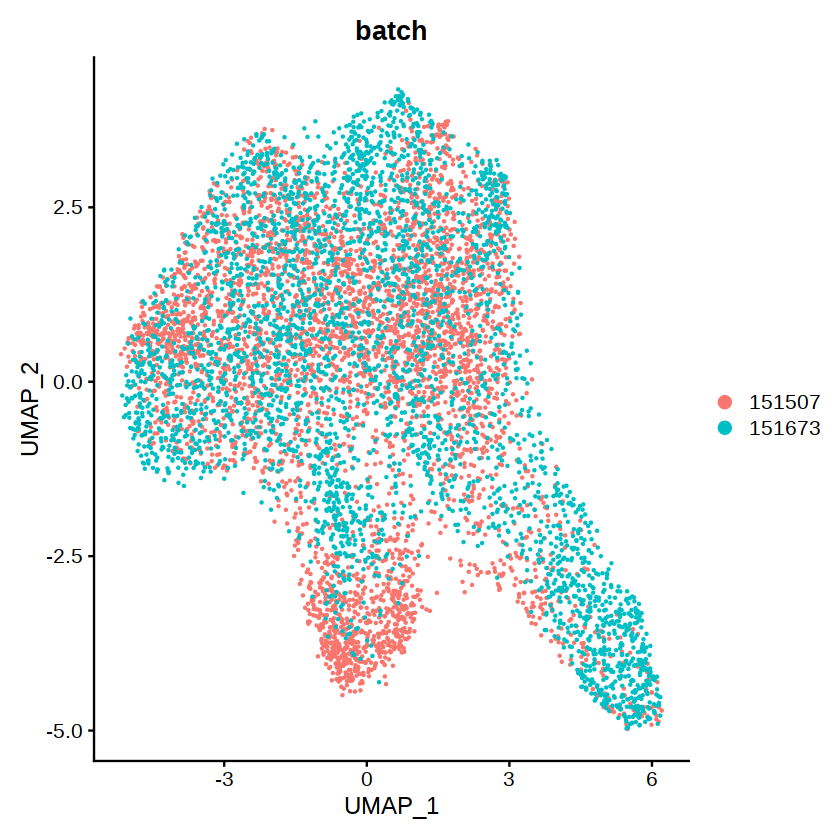

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10

Harmony converged after 10 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”
08:38:05 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

08:38:05 Read 7832 rows and found 28 numeric columns

08:38:05 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

08:38:05 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

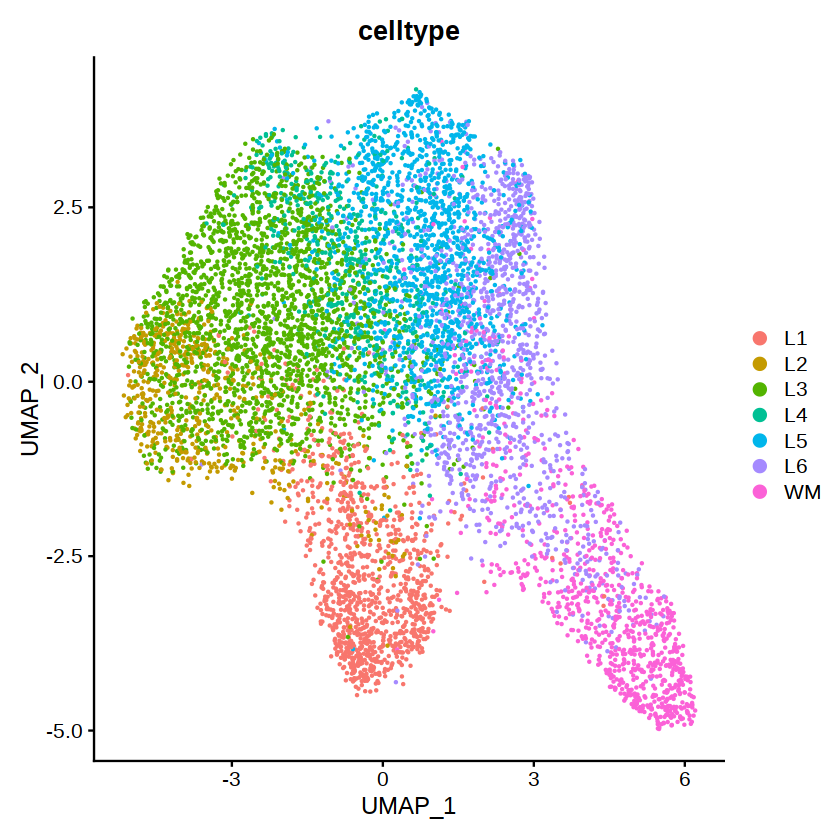

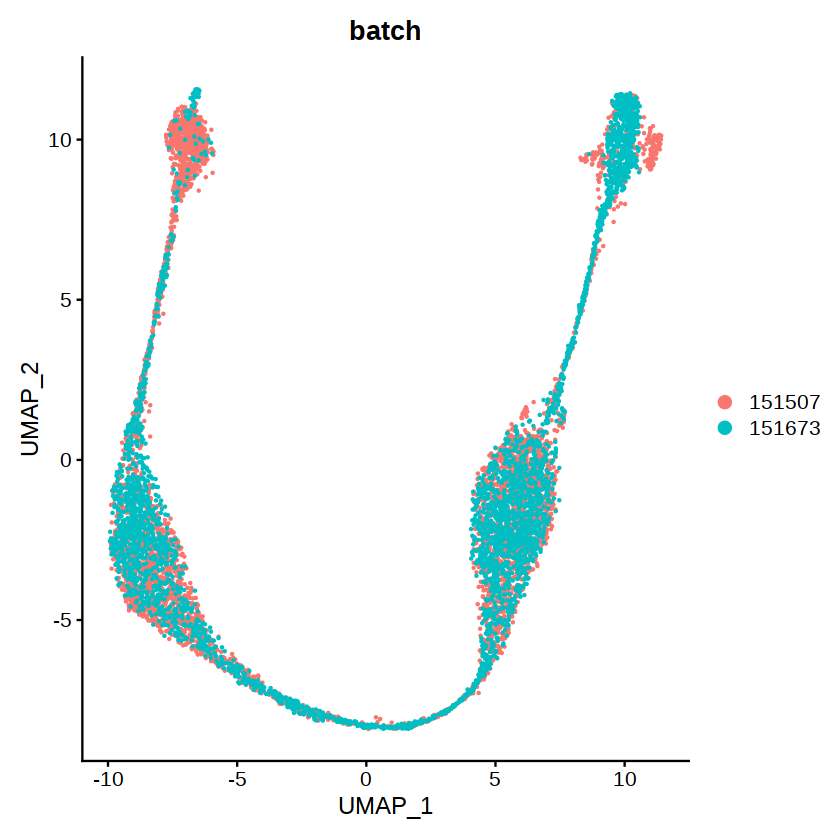

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”
08:38:58 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

08:38:58 Read 7832 rows and found 30 numeric columns

08:38:58 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

08:38:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:38:59 Writing NN index file to temp file /tmp/RtmpQJ4

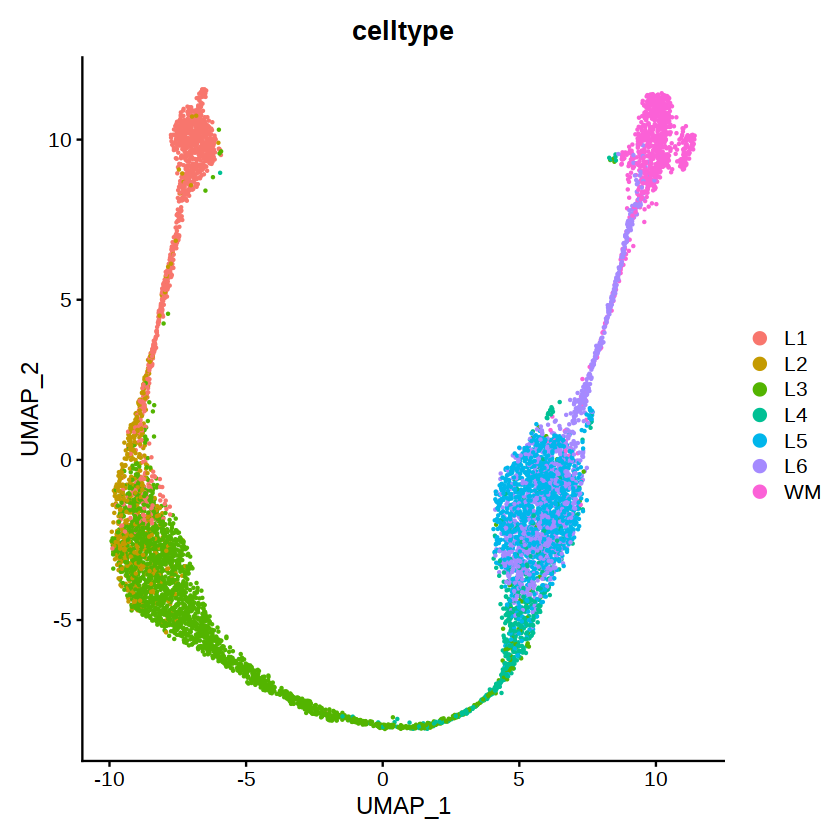

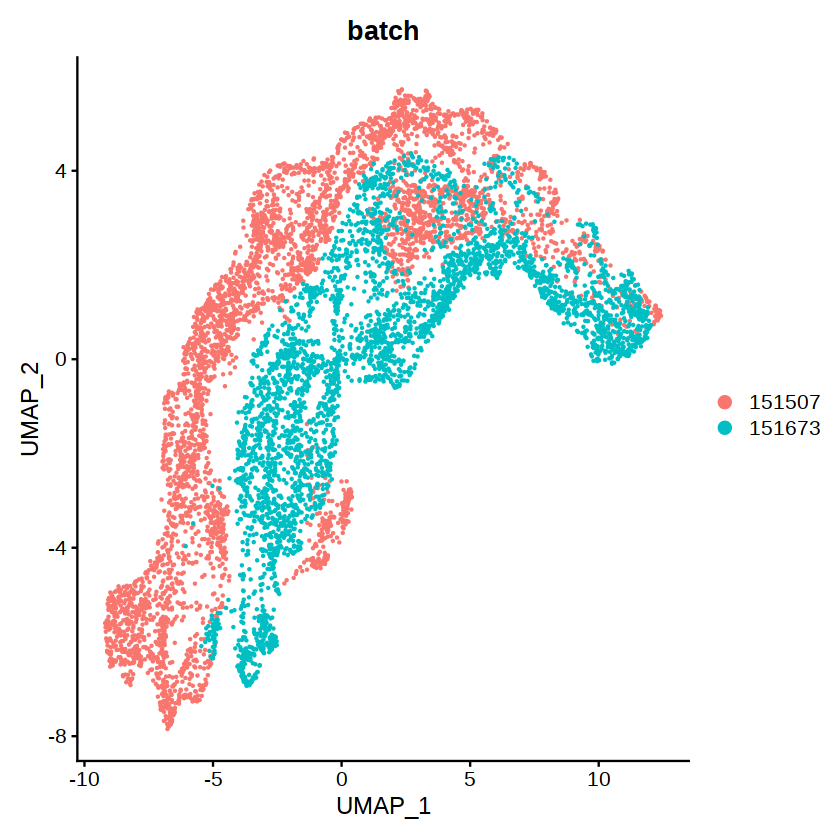

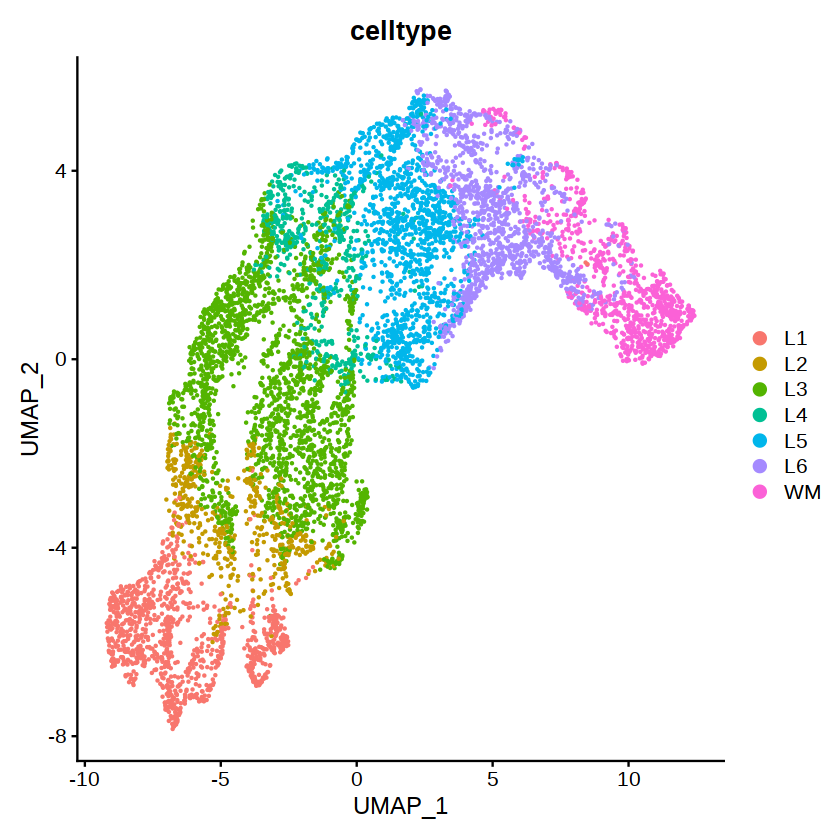

In [7]:
library(harmony)
#######harmony########
obj<-CreateSeuratObject(count=count,meta.data=meta)
obj<-ScaleData(obj)
obj@assays$RNA@scale.data=as.matrix(count)
VariableFeatures(obj)<-rownames(obj)

obj<-RunPCA(obj,npcs=30,features=rownames(obj))
obj.inte1 <- RunHarmony(obj, "batch",theta=2)
obj.inte1 <-RunUMAP(obj.inte1, reduction = "harmony",dims=1:30)
DimPlot(obj.inte1,group.by="batch")
DimPlot(obj.inte1,group.by="celltype")
x=as.data.frame(obj.inte1@reductions$harmony@cell.embeddings)
x=x[rownames(meta),]
write.csv(x,paste(dirs,"methods/harmony_mat",flags,".txt",sep=""))

# ######sedr+harmony#####
embed2=read.csv(paste(dirs,"methods/SEDR_mat",flags,".csv",sep=""),header=T,row.names=1)
embed2=embed2[colnames(count),]
obj[['SEDR']]<-CreateDimReducObject(embeddings=as.matrix(embed2), key = "SEDR_", assay = DefaultAssay(obj))

obj.inte2 <- RunHarmony(obj, "batch",theta=2,reduction='SEDR')
obj.inte2 <-RunUMAP(obj.inte2, reduction = "harmony",dims=1:dim(embed2)[2])
DimPlot(obj.inte2,group.by="batch")
DimPlot(obj.inte2,group.by="celltype")
x=as.data.frame(obj.inte2@reductions$harmony@cell.embeddings)
x=x[rownames(meta),]
write.csv(x,paste(dirs,"methods/harmony_SEDR_mat",flags,".txt",sep=""))

# ######stagate+harmony#####
embed3=read.csv(paste(dirs,"methods/STAGATE_mat",flags,".csv",sep=""),header=T,row.names=1)
embed3=embed3[colnames(count),]
obj[['STAGATE']]<-CreateDimReducObject(embeddings=as.matrix(embed3), key = "STAGATE_", assay = DefaultAssay(obj))
obj.inte3 <- RunHarmony(obj, "batch",theta=2,reduction='STAGATE')
obj.inte3 <-RunUMAP(obj.inte3, reduction = "harmony",dims=1:dim(embed3)[2])
DimPlot(obj.inte3,group.by="batch")
DimPlot(obj.inte3,group.by="celltype")
x=as.data.frame(obj.inte3@reductions$harmony@cell.embeddings)
x=x[rownames(meta),]
write.csv(x,paste(dirs,"methods/harmony_STAGATE_mat",flags,".txt",sep=""))

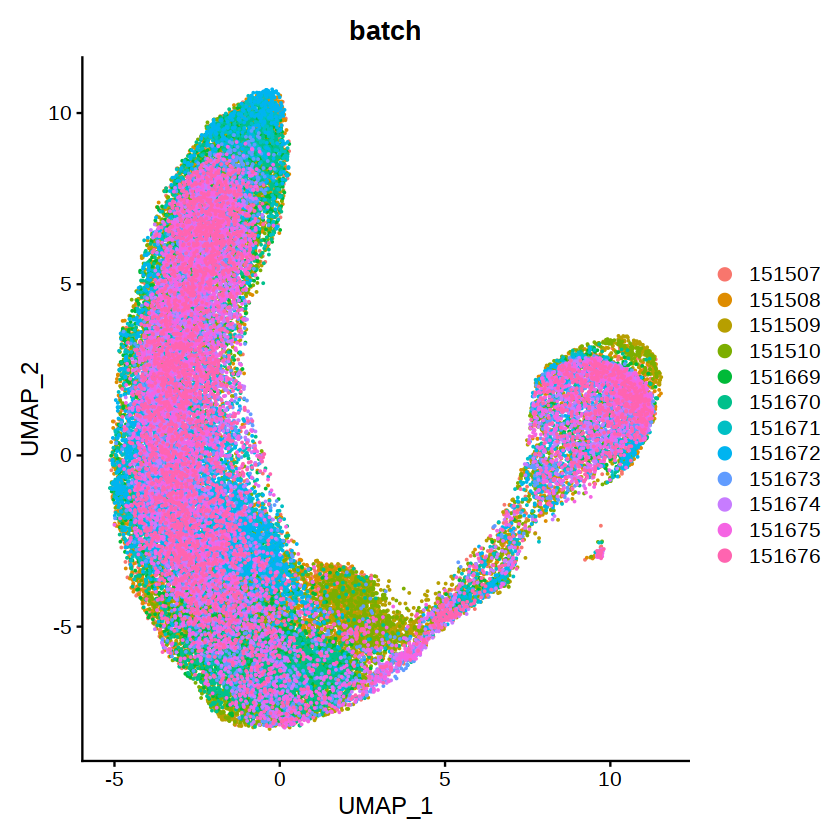

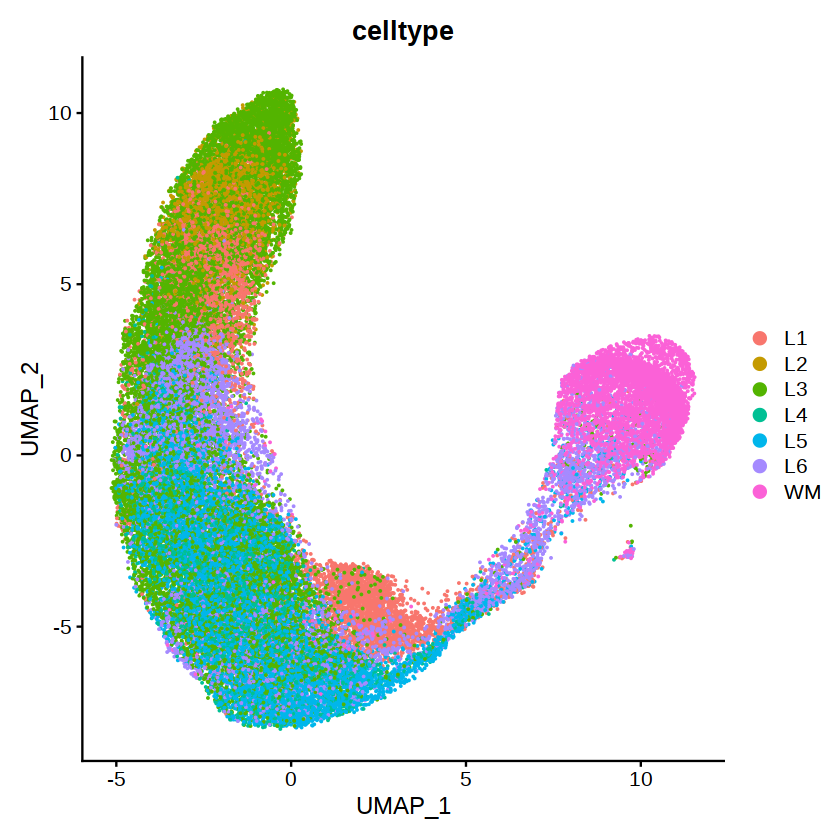

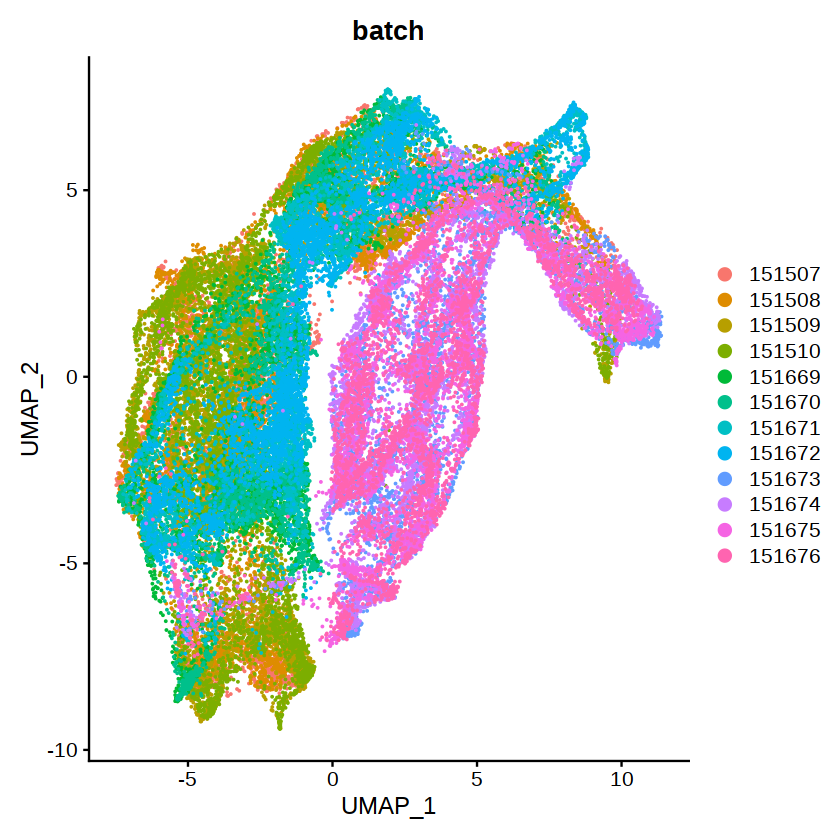

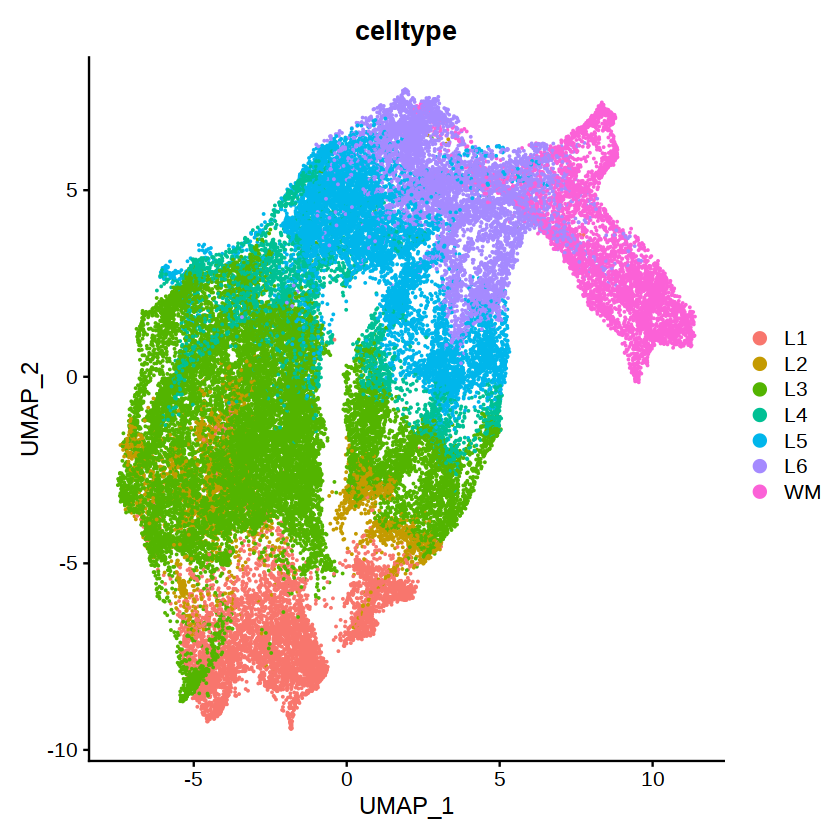

In [48]:
# DimPlot(dl,group.by='celltype',label=T)
# DimPlot(dl,group.by='batch',label=T)
DimPlot(obj.inte2,group.by="batch")
DimPlot(obj.inte2,group.by="celltype")
DimPlot(obj.inte3,group.by="batch")
DimPlot(obj.inte3,group.by="celltype")

下游分析

In [2]:
library(SingleCellExperiment)
library(rjson)
library(Seurat)
library(tripack)
# library(proxy)
library(rhdf5)
library(png)
library(ggplot2)
library(harmony)
library(fields)
library(FNN)
library(Matrix)
library(aricode)
dirs="/data02/tguo/space_batch_effect/human_DLPFC_10x/"

In [3]:
samples=c(151507,151508,151509,151510,151669,151670,151671,151672,151673,151674,151675,151676)
# samples=samples[c(9,10,11,12)]
flags1=samples[1];for(i in 2:length(samples)){flags1=paste(flags1,'-',samples[i],sep='')}
meta_file=c()
mat_file=c()
coord_file=c()
flags=''
for(i in 1:length(samples)){
    meta_file=c(meta_file,paste(dirs,"gtt_input_scanpy/",flags1,'_',samples[i],"_label.txt",sep=""))
    mat_file=c(mat_file,paste(dirs,"gtt_input_scanpy/",flags1,'_',samples[i],"_features.txt",sep=""))
    coord_file=c(coord_file,paste(dirs,"gtt_input_scanpy/",flags1,'_',samples[i],"_positions.txt",sep=""))
    flags=paste(flags,'_',samples[i],sep='')
}
meta=read.csv(meta_file[1],header=T,row.names=1,sep=',')
count=read.csv(mat_file[1],header=T,row.names=1,sep=',')
coord=read.csv(coord_file[1],header=T,row.names=1,sep=',')
for(i in 2:length(meta_file)){
    meta<-rbind(meta,read.csv(meta_file[i],header=T,row.names=1,sep=','))
    count<-rbind(count,read.csv(mat_file[i],header=T,row.names=1,sep=','))
    coord<-rbind(coord,read.csv(coord_file[i],header=T,row.names=1,sep=','))
} 
count=as.matrix(t(count))
count=as(count,'dgCMatrix')
meta=meta[colnames(count),]
coord=coord[colnames(count),]
obj<-CreateSeuratObject(counts=count,min.cells=0, min.features=0,meta.data=meta)
VariableFeatures(obj)<-rownames(obj)
obj@assays$RNA@scale.data=as.matrix(count)
# obj<-ScaleData(obj)
# obj<-RunPCA(obj,npcs=50)
# obj<-RunUMAP(obj,reduction='pca',dims=1:50)
obj@images$image <- new(
    Class = 'SlideSeq',
    assay = "Spatial",
    key = "image_",
    coordinates = coord
 )

In [4]:
embed1=read.csv(paste(dirs,"gtt_output/AGC_embed",flags,"_xent.csv",sep=""),header=T,row.names=1)
if(dim(embed1)[2]==16){
    znoise_dim=3}else{
    znoise_dim=5
}
embed1=embed1[colnames(count),znoise_dim:dim(embed1)[2]]
obj[['GTT']]<-CreateDimReducObject(embeddings=as.matrix(embed1), key = "GTT_", assay = DefaultAssay(obj))
embed2=read.csv(paste(dirs,"methods/seurat_mat",flags,".txt",sep=""),header=T,row.names=1)
embed2=embed2[colnames(count),]
obj[['Seurat']]<-CreateDimReducObject(embeddings=as.matrix(embed2), key = "Seurat_", assay = DefaultAssay(obj))
embed3=read.csv(paste(dirs,"methods/harmony_mat",flags,".txt",sep=""),header=T,row.names=1)
embed3=embed3[colnames(count),]
obj[['Harmony']]<-CreateDimReducObject(embeddings=as.matrix(embed3), key = "Harmony_", assay = DefaultAssay(obj))
embed4=read.csv(paste(dirs,"methods/harmony_SEDR_mat",flags,".txt",sep=""),header=T,row.names=1)
embed4=embed4[colnames(count),]
obj[['SEDR']]<-CreateDimReducObject(embeddings=as.matrix(embed4), key = "SEDR_", assay = DefaultAssay(obj))
embed5=read.csv(paste(dirs,"methods/harmony_STAGATE_mat",flags,".txt",sep=""),header=T,row.names=1)
embed5=embed5[colnames(count),]
obj[['STAGATE']]<-CreateDimReducObject(embeddings=as.matrix(embed5), key = "STAGATE_", assay = DefaultAssay(obj))

# obj <-RunUMAP(obj, reduction = "GTT",dims=1:dim(embed1)[2],reduction.name="GTT.umap")
# obj <-RunUMAP(obj, reduction = "Seurat",dims=1:dim(embed2)[2],reduction.name="Seurat.umap")
# obj <-RunUMAP(obj, reduction = "Harmony",dims=1:dim(embed3)[2],reduction.name="Harmony.umap")
# obj <-RunUMAP(obj, reduction = "SEDR",dims=1:dim(embed4)[2],reduction.name="SEDR.umap")
# obj <-RunUMAP(obj, reduction = "STAGATE",dims=1:dim(embed5)[2],reduction.name="STAGATE.umap")


In [22]:
res=c(0.5,0.6,0.6,0.3,0.4)
res=c(0.7,0.55,0.55,0.4,0.24)
res=c(0.6,0.5,0.6,0.2,0.2)
res=c(0.5,0.32,0.6,0.3,0.25)
res=c(0.4,0.32,0.35,0.3,0.3)
res=c(0.4,0.32,0.35,0.2,0.3)
res=c(0.35,0.32,0.35,0.2,0.3)
res=c(0.35,0.32,0.35,0.2,0.3)
res=c(0.56,0.55,0.55,0.53,0.22)
res=c(0.66,0.58,0.58,0.35,0.25)
res=c(0.8,0.55,0.55,0.3,0.23)
res=c(0.7,0.41,0.45,0.25,0.23)
res=c(0.4,0.22,0.35,0.18,0.15)

obj<-FindNeighbors(obj, dims=1:dim(embed1)[2],reduction="GTT")
obj<-FindClusters(obj, resolution =res[1])
obj$gtt=obj$seurat_clusters
length(unique(obj$gtt))

# obj<-FindNeighbors(obj, dims=1:dim(embed2)[2],reduction="Seurat")
# obj<-FindClusters(obj, resolution = res[2])
# obj$seurat=obj$seurat_clusters
# length(unique(obj$seurat))

# obj<-FindNeighbors(obj, dims=1:dim(embed3)[2],reduction="Harmony")
# obj<-FindClusters(obj, resolution = res[3])
# obj$harmony=obj$seurat_clusters
# length(unique(obj$harmony))

# obj<-FindNeighbors(obj, dims=1:dim(embed4)[2],reduction="SEDR")
# obj<-FindClusters(obj, resolution =res[4])
# obj$sedr=obj$seurat_clusters
# length(unique(obj$sedr))


# obj<-FindNeighbors(obj, dims=1:dim(embed5)[2],reduction="STAGATE")
# obj<-FindClusters(obj, resolution =res[5])
# obj$stagate=obj$seurat_clusters
# length(unique(obj$stagate))

# write.csv(as.data.frame(obj$gtt),paste(dirs,'metrics/louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$seurat),paste(dirs,'metrics/seurat_louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$harmony),paste(dirs,'metrics/harmony_louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$sedr),paste(dirs,'metrics/SEDR_louvain_clust',flags,'.csv',sep=""))
# write.csv(as.data.frame(obj$stagate),paste(dirs,'metrics/STAGATE_louvain_clust',flags,'.csv',sep=""))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 47329
Number of edges: 1139754

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8568
Number of communities: 9
Elapsed time: 14 seconds


2 singletons identified. 7 final clusters.



[1] 7

In [7]:
ari=data.frame(method=c('GraphSCIDRL','seurat','harmony_STAGATE','harmony_SEDR','harmony'),
              ARI_louvain=c(ARI(obj$gtt,obj$celltype),ARI(obj$seurat,obj$celltype),
                            ARI(obj$stagate,obj$celltype),
                            ARI(obj$sedr,obj$celltype),ARI(obj$harmony,obj$celltype)))
# write.csv(ari,paste(dirs,'metrics/ARI_louvain',flags,'.csv',sep=""))
ari

method,ARI_louvain
<chr>,<dbl>
GraphSCIDRL,0.3754813
seurat,0.2007865
harmony_STAGATE,0.3256754
harmony_SEDR,0.1224951
harmony,0.2471603


In [8]:
obj <-RunUMAP(obj, reduction = "GTT",dims=1:dim(embed1)[2],reduction.name="GTT.umap")
obj <-RunUMAP(obj, reduction = "Seurat",dims=1:dim(embed2)[2],reduction.name="Seurat.umap")
obj <-RunUMAP(obj, reduction = "Harmony",dims=1:dim(embed3)[2],reduction.name="Harmony.umap")
obj <-RunUMAP(obj, reduction = "SEDR",dims=1:dim(embed4)[2],reduction.name="SEDR.umap")
obj <-RunUMAP(obj, reduction = "STAGATE",dims=1:dim(embed5)[2],reduction.name="STAGATE.umap")

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
19:14:38 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

19:14:38 Read 47329 rows and found 28 numeric columns

19:14:38 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

19:14:38 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:14:46 Writing NN index file to 

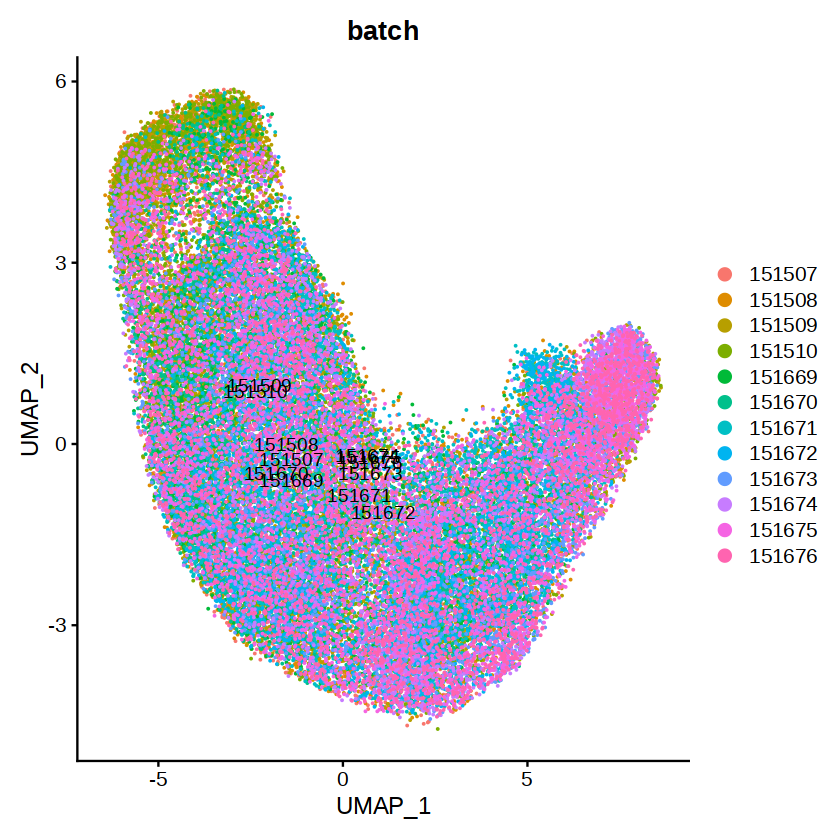

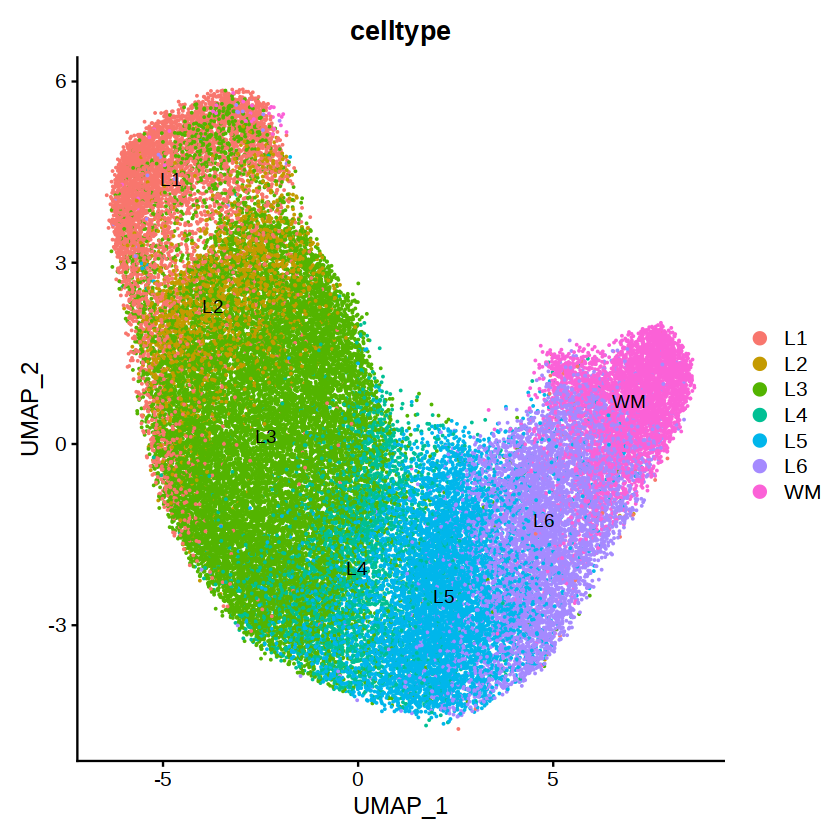

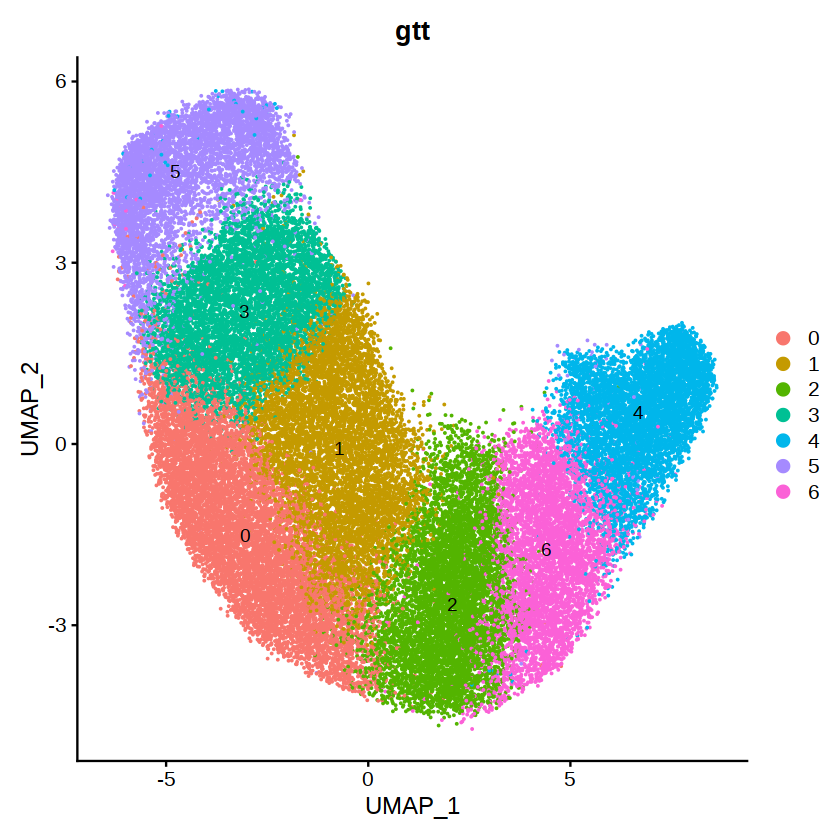

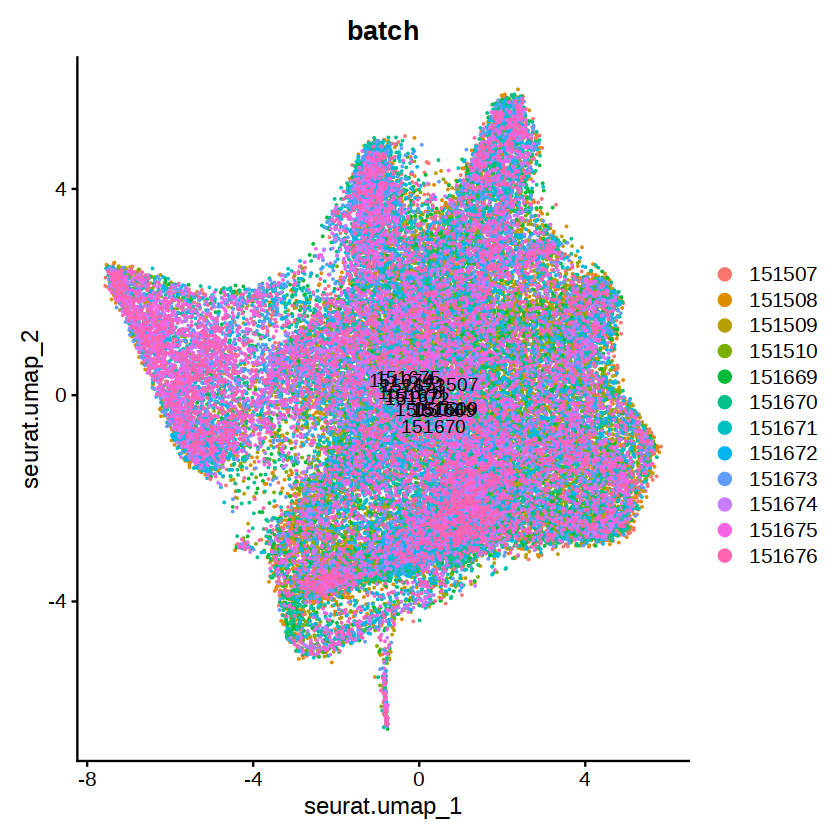

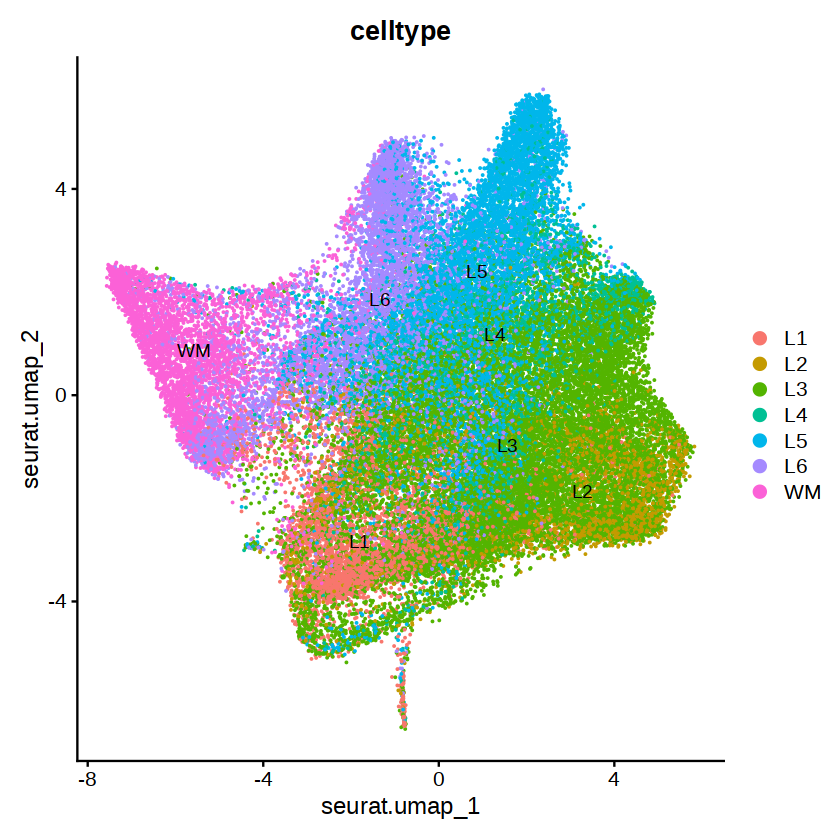

...

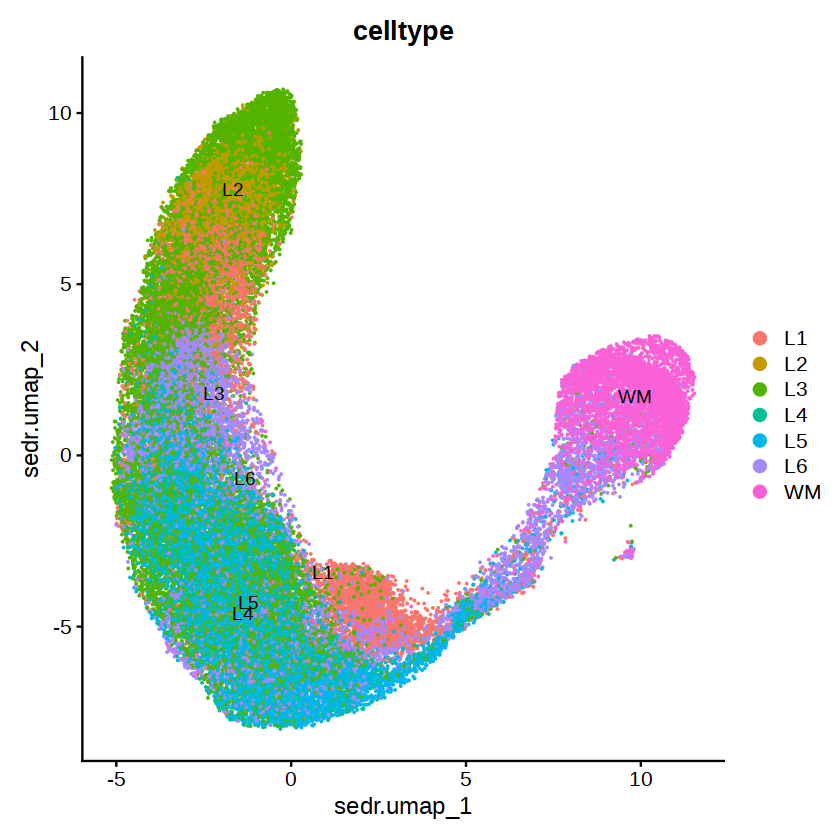

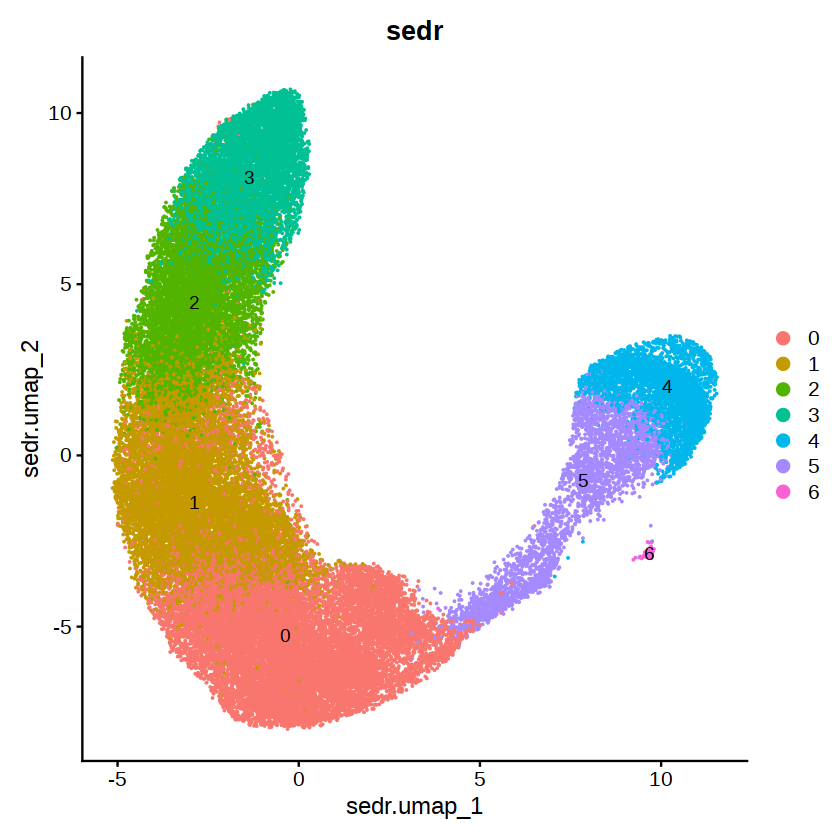

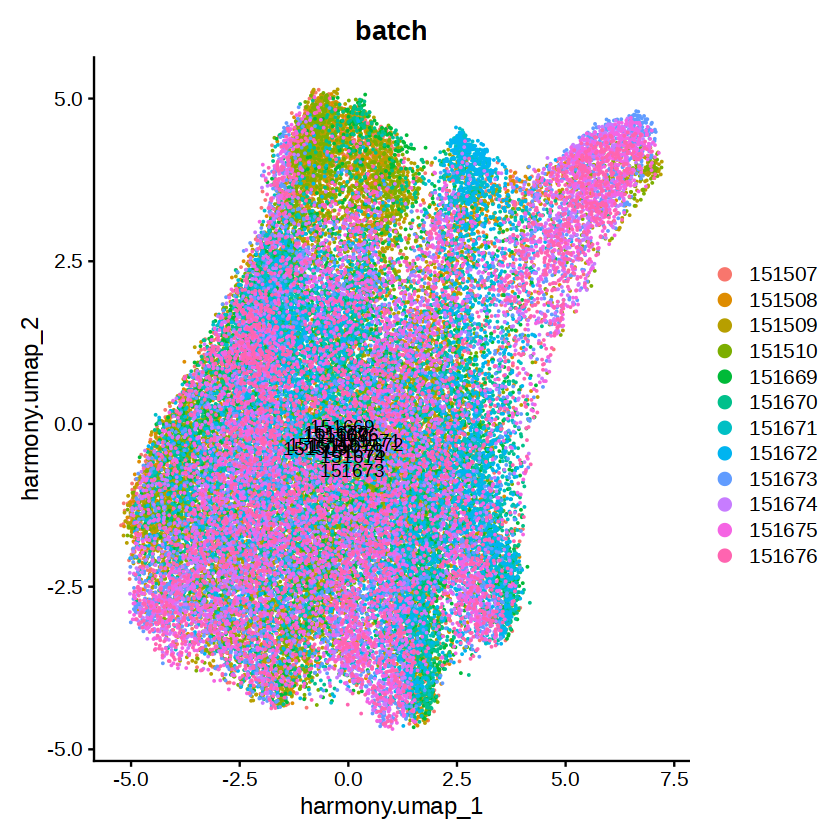

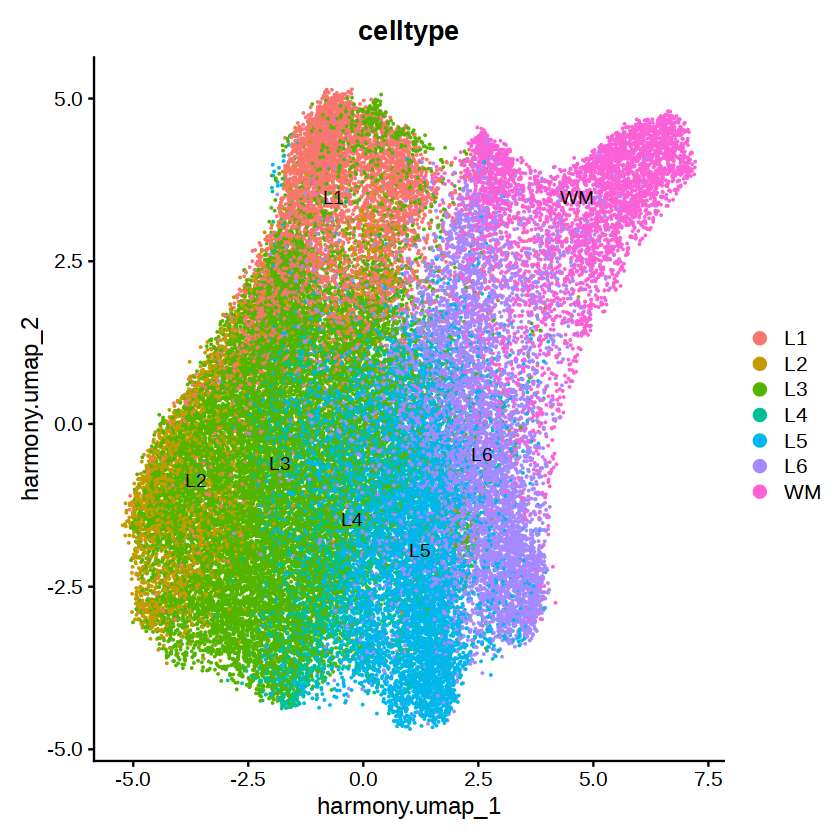

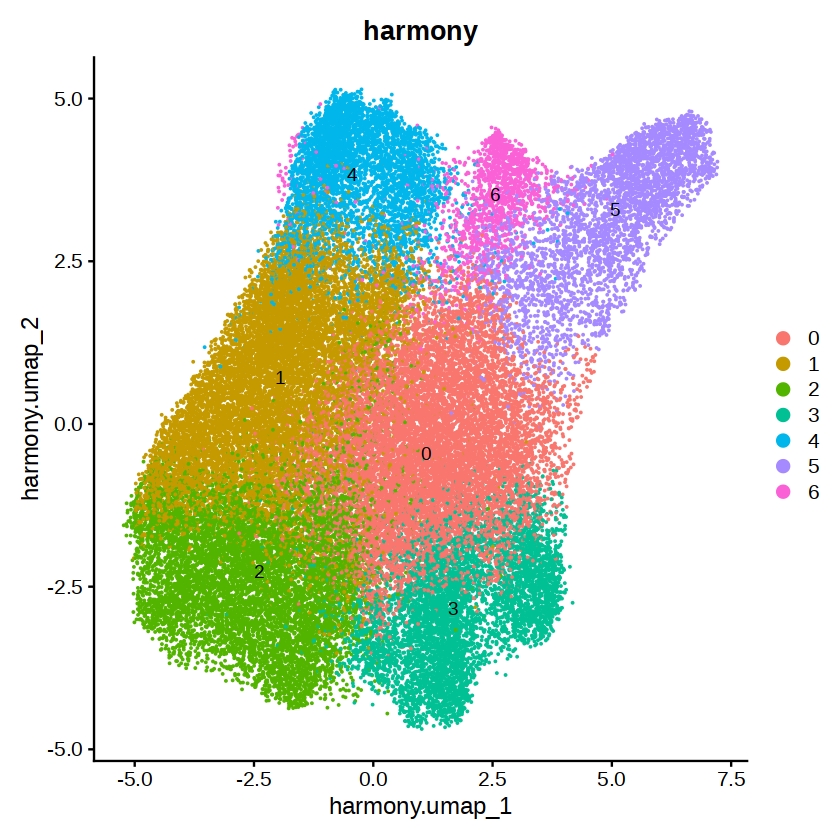

In [9]:
DimPlot(obj,group.by="batch",label=T,reduction='GTT.umap')
DimPlot(obj,group.by="celltype",label=T,reduction='GTT.umap')
DimPlot(obj,group.by="gtt",label=T,reduction='GTT.umap')

DimPlot(obj,group.by="batch",label=T,reduction='Seurat.umap')
DimPlot(obj,group.by="celltype",label=T,reduction='Seurat.umap')
DimPlot(obj,group.by="seurat",label=T,reduction='Seurat.umap')

DimPlot(obj,group.by="batch",label=T,reduction='STAGATE.umap')
DimPlot(obj,group.by="celltype",label=T,reduction='STAGATE.umap')
DimPlot(obj,group.by="stagate",label=T,reduction='STAGATE.umap')

DimPlot(obj,group.by="batch",label=T,reduction='SEDR.umap')
DimPlot(obj,group.by="celltype",label=T,reduction='SEDR.umap')
DimPlot(obj,group.by="sedr",label=T,reduction='SEDR.umap')

DimPlot(obj,group.by="batch",label=T,reduction='Harmony.umap')
DimPlot(obj,group.by="celltype",label=T,reduction='Harmony.umap')
DimPlot(obj,group.by="harmony",label=T,reduction='Harmony.umap')

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



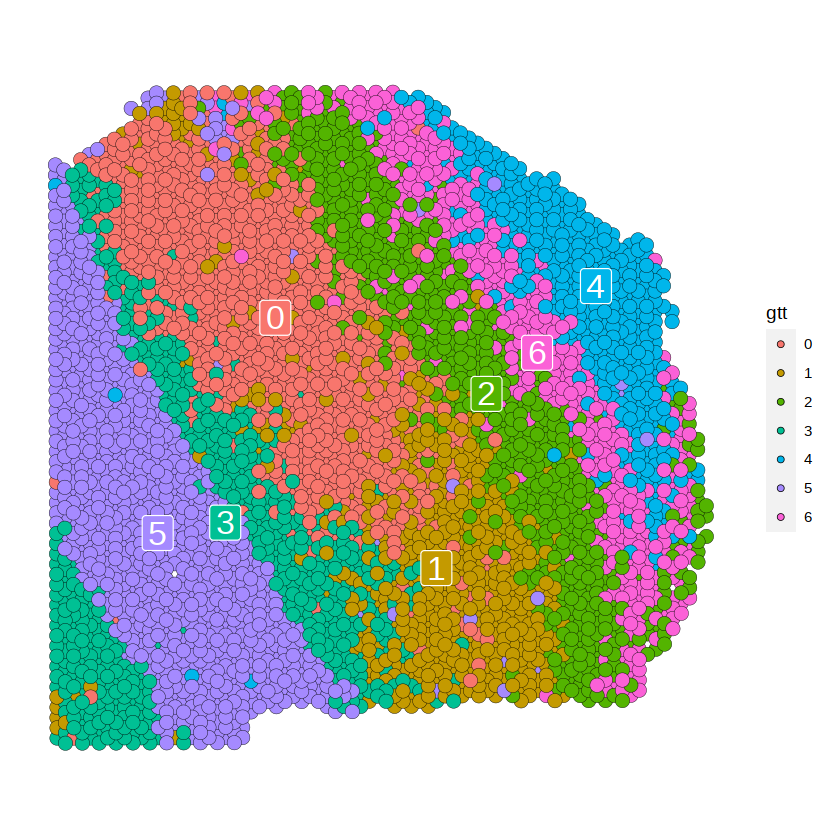

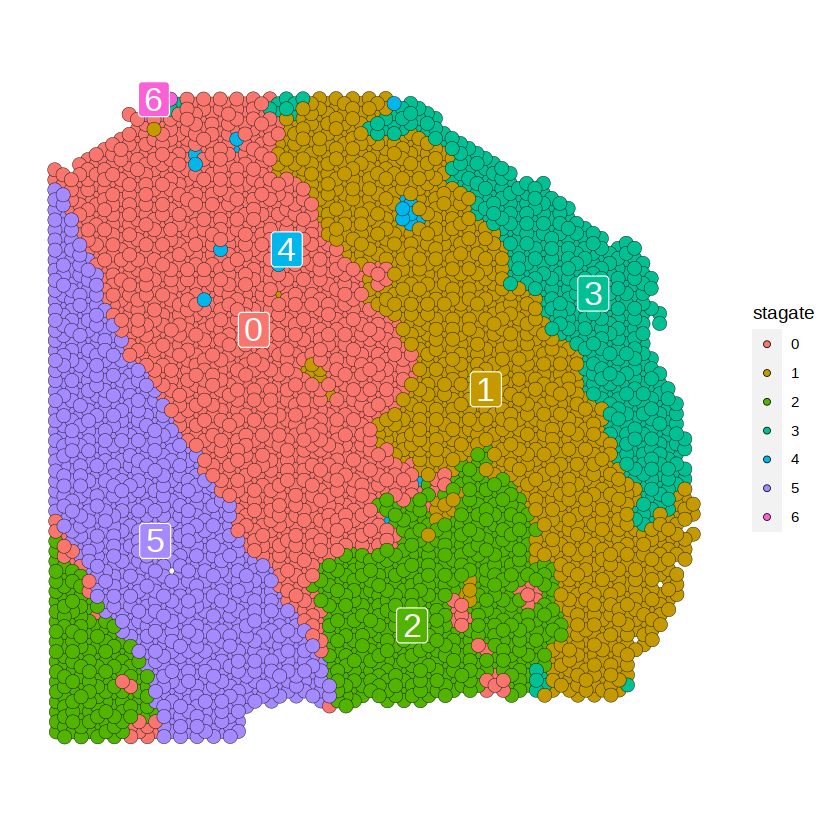

In [20]:
# ub=unique(obj$batch)
# obj1<-subset(obj,subset=batch==ub[1])
size=5
SpatialDimPlot(obj1,group.by="gtt",label=T,pt.size=size)
SpatialDimPlot(obj1,group.by="stagate",label=T,pt.size=size)

In [1]:
obj.cds <- as.cell_data_set(obj)
# obj.cds <- cluster_cells(cds = obj.cds, reduction_method = "UMAP")
# obj.cds <- learn_graph(obj.cds, use_partition = TRUE)



ERROR: Error in as.cell_data_set(obj): could not find function "as.cell_data_set"


In [2]:
library(monocle3)

ERROR: Error in library(monocle3): there is no package called ‘monocle3’


PDAC

In [159]:
dir_name="/data02/tguo/sptail_temporal/PDAC/"
exp1=read.csv(paste(dir_name,"GSE111672_PDAC-A-indrop-filtered-expMat.txt",sep=""),header=T,sep="\t")
exp2=read.csv(paste(dir_name,"GSE111672_PDAC-B-indrop-filtered-expMat.txt",sep=""),header=T,sep="\t")
bar1=read.table(paste(dir_name,"GSE111672_inDrop_gel_barcode1_list.txt",sep=""),stringsAsFactors=F)
bar2=read.table(paste(dir_name,"GSE111672_inDrop_gel_barcode2_list.txt",sep=""),stringsAsFactors=F)
st_barcode1=read.table(paste(dir_name,"GSE111672_LP_slide.batch_10001.version2.txt",sep=""),stringsAsFactors=F)
st_barcode2=read.table(paste(dir_name,"GSE111672_1000L3_barcodes.txt",sep=""),stringsAsFactors=F)

st1=read.csv(paste(dir_name,"GSM3036911_PDAC-A-ST1-filtered.txt",sep=""),header=T,sep="\t")
st2=read.csv(paste(dir_name,"GSM3405534_PDAC-B-ST1-filtered.txt",sep=""),header=T,sep="\t")
# st2=read.csv(paste(dir_name,"GSM4100721_PDAC-A-st2.tsv",sep=""),header=T,sep="\t")
# st3=read.csv(paste(dir_name,"GSM4100722_PDAC-A-st3.tsv",sep=""),header=T,sep="\t")

In [189]:
# exp1<-as.matrix(exp1)
# rownames(exp1)<-exp1[,1]
# exp1<-exp1[,-1]
# celltype=as.data.frame(sapply(colnames(exp1),function(x){strsplit(x,'\\.')[[1]][1]}))
# colnames(celltype)='celltype'
sc1<-CreateSeuratObject(counts=exp1,meta.data=celltype)
sc1<-SCTransform(sc1,verbose=F)
sc1<-FindVariableFeatures(sc1,nfeatures=2000)
sc1<-RunPCA(sc1)
sc1<-RunUMAP(sc1,dims=1:30)
DimPlot(sc1,reduction="umap",group="layer_map",label=T)
SpatialDimPlot(sc1,group.by='layer_map',label=TRUE)

Warning message:
“Non-unique features (rownames) present in the input matrix, making unique”
Warning message:
“The following arguments are not used: row.names”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in sqrt(1/i):
“NaNs produced”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warnin

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

ERROR: Error: Cannot find 'layer_map' in this Seurat object


Genes,X10x13,X10x14,X10x15,X10x16,X10x17,X10x19,X10x20,X10x21,X10x22,⋯,X9x17,X9x18,X9x19,X9x20,X9x21,X9x22,X9x23,X9x24,X9x25,X9x26
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
A1BG,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
A1CF,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
A2M,0,2,3,0,0,0,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
A2ML1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
A3GALT2,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
A4GALT,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
A4GNT,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AAAS,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AACS,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
